In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.patches as mpatches
import scanpy as sc
import anndata
from sklearn.neighbors import NearestNeighbors
from collections import Counter
import matplotlib
import scipy.stats as stats


In [2]:
all_cells_umap = pd.read_csv("UMAP_Integrated.csv")

/tmp/ipykernel_1132/799857196.py:1: DtypeWarning: Columns (11,12,21,22,25,26,27,28,29,30,31,32,33,34,35,39,44) have mixed types. Specify dtype option on import or set low_memory=False.
  all_cells_umap = pd.read_csv("UMAP_Integrated.csv")


In [3]:
len(set(all_cells_umap['orig.ident']))

50

In [4]:
ctrl_cell_only_umap = all_cells_umap[~all_cells_umap["cell_type_fine"].isna()]

/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


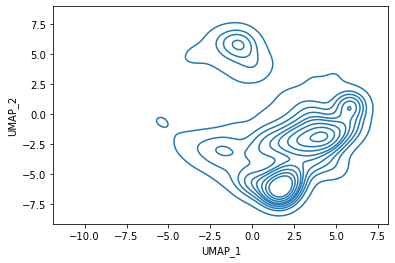

In [5]:
sns.kdeplot(ctrl_cell_only_umap["UMAP_1"], ctrl_cell_only_umap["UMAP_2"])
plt.show()

<AxesSubplot:xlabel='UMAP_1', ylabel='UMAP_2'>

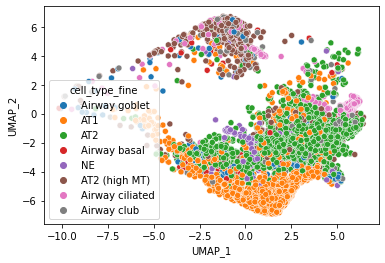

In [6]:
sns.scatterplot(data=ctrl_cell_only_umap, x="UMAP_1", y="UMAP_2", hue="cell_type_fine")


/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'lw'
  cset = contour_func(


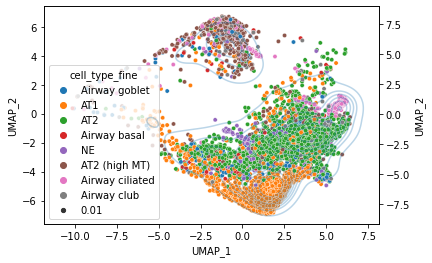

In [7]:
fig, ax = plt.subplots()
sns.scatterplot(data=all_cells_umap, x="UMAP_1", y="UMAP_2", hue="cell_type_fine", ax  = ax, size = 0.01)
ax2 = ax.twinx()
kdeplot = sns.kdeplot(data=ctrl_cell_only_umap, x="UMAP_1", y="UMAP_2", fill = False, ax = ax2, alpha=0.3, lw=20)


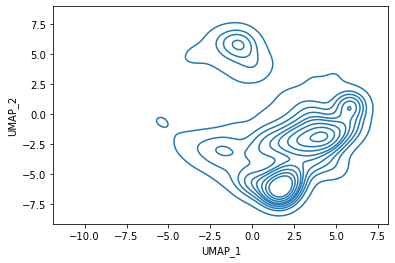

In [8]:
kde = sns.kdeplot(data=ctrl_cell_only_umap, x="UMAP_1", y="UMAP_2")
ctrl_contours = []
for i in kde.get_children():
    if i.__class__.__name__ == 'PathCollection':
        ctrl_contours.append(i.get_paths())

In [9]:
##ASSIGNED PEAKS Assigned in above data

peaks = {
 "AT2_high_MT" : ctrl_contours[3][1],
 "Airway_Ciliated":ctrl_contours[5][2],
 "AT1": ctrl_contours[8][0],
 "AT2-Main": ctrl_contours[8][1], 
 "NA-Peak": ctrl_contours[0][1],
 "AT2-Second": ctrl_contours[2][1]
}

palette = {
 "AT2_high_MT_cluster" : "#ff0000",
 "Airway_Ciliated_cluster": "#ffd700",
 "AT1_cluster": "#c71585",
 "AT2-Main_cluster": "#7fffd4", 
 "NA-Peak_cluster": "#00ff00",
 "AT2-Second_cluster": "#808000",
 "Mixed Lineage": "#808080"
    
}

cols = []

points = list(zip(ctrl_cell_only_umap.UMAP_1, ctrl_cell_only_umap.UMAP_2))
points
for x in peaks:
    ctrl_cell_only_umap[x + "_cluster"] = peaks[x].contains_points(points)
    cols.append(x + "_cluster")
assigned_cluster_knn_training = []


for i,x in ctrl_cell_only_umap.iterrows():
    found = False
    for y in cols:
        if x[y] and not found:
            assigned_cluster_knn_training.append(y)
            found = True
    if not found:
        assigned_cluster_knn_training.append("None")

ctrl_cell_only_umap["assigned_cluster_knn_training"] = assigned_cluster_knn_training



/tmp/ipykernel_1132/1754739421.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ctrl_cell_only_umap[x + "_cluster"] = peaks[x].contains_points(points)
/tmp/ipykernel_1132/1754739421.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ctrl_cell_only_umap[x + "_cluster"] = peaks[x].contains_points(points)
/tmp/ipykernel_1132/1754739421.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats

In [10]:
#Load PCA data

In [11]:
"""
rna_counts = pd.read_csv("integrated_cell_data_counts.csv")
rna_counts= rna_counts.set_index("Unnamed: 0").T
rna_counts = rna_counts[rna_counts.index.isin(all_cells_umap["Unnamed: 0"])]
adata = anndata.AnnData(X= rna_counts, obs = all_cells_umap.set_index("Unnamed: 0"))


sc.tl.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata, n_components=10)
sc.tl.pca(adata, n_comps=10)
pca_counts = pd.DataFrame(adata.obsm["X_pca"], index = adata.obs.index)
pca_counts.to_pickle("pca_counts.pkl")

"""

pca_counts = pd.read_pickle("pca_counts.pkl")

In [12]:
#Nearest Neighbor Model
neigh = NearestNeighbors(n_neighbors=10)
neigh.fit(pca_counts)

#Training_data
train = ctrl_cell_only_umap[ctrl_cell_only_umap["assigned_cluster_knn_training"] != "None"]

train_x = pca_counts.loc[list(train["Unnamed: 0"])]


cluster_dictionary_pca = {}
cluster_dictionary_pca_listed = {}




In [13]:
for cluster in set(train["assigned_cluster_knn_training"]):
    
    
    rng = neigh.kneighbors(
        train_x.loc[list(train[train["assigned_cluster_knn_training"] == cluster]["Unnamed: 0"])])
    
    #Set of all cells assigned to given cluster
    all_indexes = set()
    all_indexes_list = []
    
    #Iterate through first round of identified neighbors, add to all_indexes
    for x in rng[1]:
        all_indexes = all_indexes | set(x)
        all_indexes_list.extend(list(set(x)))
    
    
    
    to_find_neighbors = set(all_indexes)
    previous_search= set()
    
    #Repeat iterations 5 times. Add cells to to_find_neighbors
    for iteration in range(5):
        print(len(to_find_neighbors))
        cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")
        rng = neigh.kneighbors(cells)
        previous_search = previous_search | to_find_neighbors
        to_find_neighbors = set()
        for x in rng[1]:
            to_find_neighbors = to_find_neighbors | set(x)
            all_indexes = all_indexes | set(x)
            all_indexes_list.extend(list(set(x)))
        
        #avoid re-computing data on previously searched neighbors 
        to_find_neighbors = to_find_neighbors - previous_search
        
        
        
    cells = pca_counts.reset_index().loc[all_indexes]
    t = all_cells_umap.set_index("Unnamed: 0").loc[set(all_cells_umap["Unnamed: 0"]) & set(cells["Unnamed: 0"])]
    
    cluster_dictionary_pca[cluster] = set(all_cells_umap["Unnamed: 0"]) & set(cells["Unnamed: 0"])
    
    cluster_dictionary_pca_listed[cluster] = all_indexes_list

379


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


594


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


730


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


849


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


1137


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")
/tmp/ipykernel_1132/4233669497.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[all_indexes]
/tmp/ipykernel_1132/4233669497.py:39: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  t = all_cells_umap.set_index("Unnamed: 0").loc[set(all_cells_umap["Unnamed: 0"]) & set(cells["Unnamed: 0"])]


1871


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


1690


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


3578


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


4679


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


4863


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")
/tmp/ipykernel_1132/4233669497.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[all_indexes]
/tmp/ipykernel_1132/4233669497.py:39: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  t = all_cells_umap.set_index("Unnamed: 0").loc[set(all_cells_umap["Unnamed: 0"]) & set(cells["Unnamed: 0"])]


241


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


612


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


1372


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


2488


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


3681


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")
/tmp/ipykernel_1132/4233669497.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[all_indexes]
/tmp/ipykernel_1132/4233669497.py:39: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  t = all_cells_umap.set_index("Unnamed: 0").loc[set(all_cells_umap["Unnamed: 0"]) & set(cells["Unnamed: 0"])]
/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


89
253


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


623


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


1156


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


2217


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")
/tmp/ipykernel_1132/4233669497.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[all_indexes]
/tmp/ipykernel_1132/4233669497.py:39: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  t = all_cells_umap.set_index("Unnamed: 0").loc[set(all_cells_umap["Unnamed: 0"]) & set(cells["Unnamed: 0"])]


199


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


160


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


535


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


1423


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


2372


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")
/tmp/ipykernel_1132/4233669497.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[all_indexes]
/tmp/ipykernel_1132/4233669497.py:39: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  t = all_cells_umap.set_index("Unnamed: 0").loc[set(all_cells_umap["Unnamed: 0"]) & set(cells["Unnamed: 0"])]


1233


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


1861


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


2914


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


3315


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")


3457


/tmp/ipykernel_1132/4233669497.py:24: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[to_find_neighbors].set_index("Unnamed: 0")
/tmp/ipykernel_1132/4233669497.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  cells = pca_counts.reset_index().loc[all_indexes]
/tmp/ipykernel_1132/4233669497.py:39: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  t = all_cells_umap.set_index("Unnamed: 0").loc[set(all_cells_umap["Unnamed: 0"]) & set(cells["Unnamed: 0"])]


In [14]:
#Adjust for cells that may have been assigned multiple times (and sometimes to multiple clusters)

cluster_counters = {}
for x in cluster_dictionary_pca_listed:
    cluster_counters[x] = Counter(cluster_dictionary_pca_listed[x])
    
count_dict = pca_counts.reset_index()["Unnamed: 0"].to_dict()
count_dict = dict([(value, key) for key, value in count_dict.items()])


In [15]:
all_cells = set()
for x in cluster_dictionary_pca:
    all_cells = all_cells | cluster_dictionary_pca[x]
cell_assigned_cluster = {}
for x in all_cells:
    max_c = 0
    type_val = ""
    for y in cluster_dictionary_pca:
        if x in cluster_dictionary_pca[y]:
            count = cluster_counters[y][count_dict[x]]
            
            if count > max_c:
                max_c = count
                type_val = y
    cell_assigned_cluster[x] = type_val

In [16]:
def assign_cell(cell, cell_type):
    if cell in cell_assigned_cluster:
        return cell_assigned_cluster[cell]
    
    
    return "Mixed Lineage"

all_cells_umap["Nearest_clustering_PCA"] = all_cells_umap.apply(lambda x: assign_cell(x["Unnamed: 0"], x["cell_type_fine"]), axis = 1)

In [17]:
tumor_cells_only = all_cells_umap[~all_cells_umap["orig.ident"].isin(['C51ctr',
 'C52ctr',
 'C53ctr',
 'C54ctr',
 'C55ctr',
 'C57ctr'])]


#Percentage of Mixed-Lineage Cells
len(tumor_cells_only[tumor_cells_only["Nearest_clustering_PCA"]== "Mixed Lineage"])/len(tumor_cells_only)

0.8295239149383621

/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.15 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


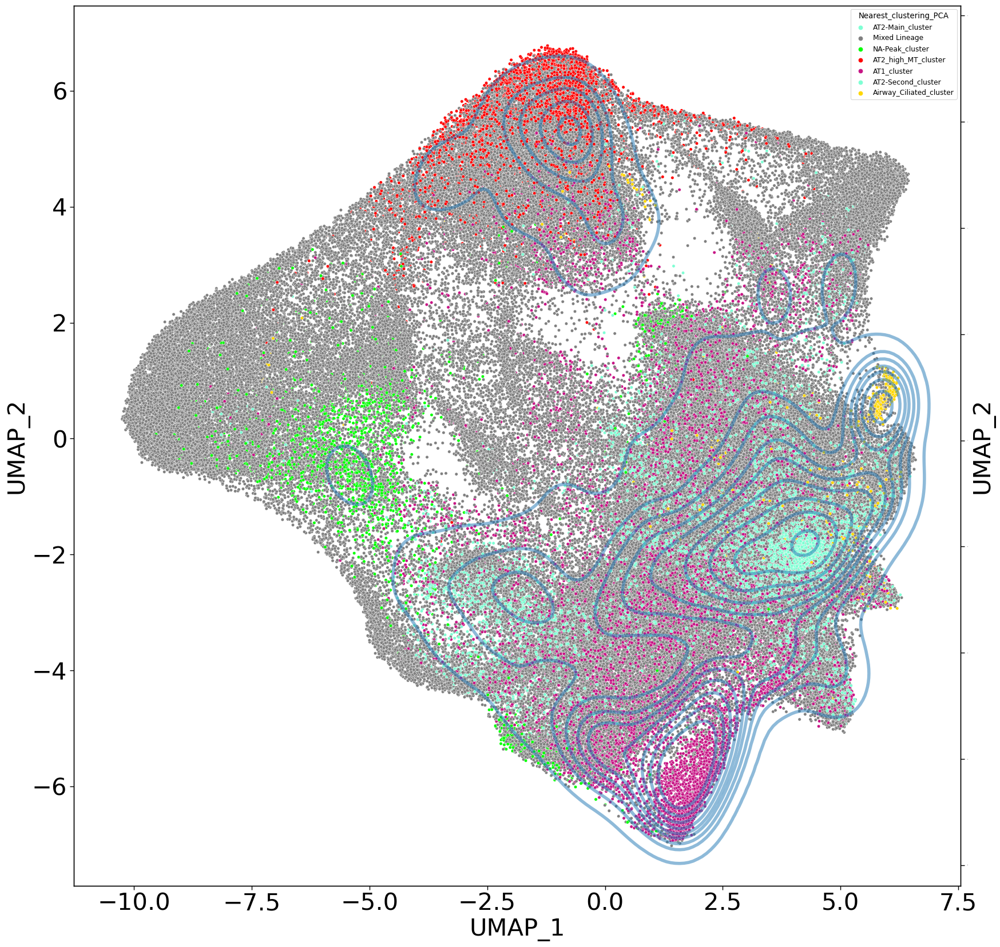

In [18]:
matplotlib.rc_file_defaults()
plt.rcParams['figure.figsize']=(20,20)


palette = {
 "AT2_high_MT_cluster" : "#ff0000",
 "Airway_Ciliated_cluster": "#ffd700",
 "AT1_cluster": "#c71585",
 "AT2-Main_cluster": "#7fffd4", 
 "NA-Peak_cluster": "#00ff00",
 "AT2-Second_cluster": "#7fffd4",
 "Mixed Lineage": "#808080"
    
}
sns.set_context("paper", rc={"font.size":20,"axes.titlesize":30,"axes.labelsize":30})   
fig, ax = plt.subplots()

t = sns.scatterplot(data=all_cells_umap, x="UMAP_1", y="UMAP_2", hue="Nearest_clustering_PCA", ax=ax, palette=palette, s=15)
t.tick_params(labelsize=30)


ax2 = ax.twinx()

t2 = sns.kdeplot(data=ctrl_cell_only_umap, x="UMAP_1", y="UMAP_2", fill = False, ax = ax2, linewidths=4,  
            alpha=0.5, bw=0.15)

t2.tick_params(labelsize=0)


In [19]:
random_walk = pd.read_csv("random_walk_prob_results.csv").set_index("rownames").drop("Unnamed: 0", axis = 1)
random_walk['assignment'] = random_walk.apply(lambda row: row.idxmax(), axis=1)
dict(random_walk['assignment'] )

{'Tumor_PA001_TGTCCCAAGCTTCGCG-1': 'AT2_high_MT_cluster',
 'Tumor_PA004_GCCTCTACATGGTCTA-1': 'Mixed Lineage',
 'Tumor_PA004_AACTTTCTCTCGAGTA-1': 'AT2_high_MT_cluster',
 'Tumor_PA004_ACCAGTAAGCGCTCCA-1': 'AT1_cluster',
 'Tumor_PA004_AGGTCATAGGCCCTTG-1': 'AT2-Main_cluster',
 'Tumor_PA004_GAGGTGACAGTAGAGC-1': 'AT2_high_MT_cluster',
 'Tumor_PA004_ATTTCTGAGTACTTGC-1': 'AT2-Main_cluster',
 'Tumor_PA004_TGTATTCAGAGGTAGA-1': 'AT1_cluster',
 'Tumor_PA004_CATCAGATCATGTCTT-1': 'AT2-Main_cluster',
 'Tumor_PA004_GTCGTAATCCACGACG-1': 'Mixed Lineage',
 'Tumor_PA004_CAGATCAGTAGCCTAT-1': 'AT2-Main_cluster',
 'Tumor_PA004_TCAATCTCAGACACTT-1': 'AT1_cluster',
 'Tumor_PA004_CACATAGAGTAGGTGC-1': 'AT2_high_MT_cluster',
 'Tumor_PA004_CCTATTACAGGACGTA-1': 'AT2-Main_cluster',
 'Tumor_PA004_TATTACCCAGGGTTAG-1': 'AT2-Main_cluster',
 'Tumor_PA004_GAAGCAGTCTGATACG-1': 'AT2_high_MT_cluster',
 'Tumor_PA004_ATTGGTGGTATGAAAC-1': 'AT2_high_MT_cluster',
 'Tumor_PA004_TGATTTCCATTCTTAC-1': 'AT1_cluster',
 'Tumor_PA004_CTCG

In [20]:
dictionary_assignments = dict(random_walk['assignment'] )

In [21]:


all_cells_umap['random_walk_assignment'] = [dictionary_assignments.get(idx, 'NA') for idx in all_cells_umap["Unnamed: 0"]]


def filter_out(row):
    return (row["Nearest_clustering_PCA"] == "Mixed Lineage") & (row["random_walk_assignment"] == "NA")

random_walk_graph = all_cells_umap[all_cells_umap.apply(lambda x: not filter_out(x), axis =1  )]


/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.25 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.25 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: Future

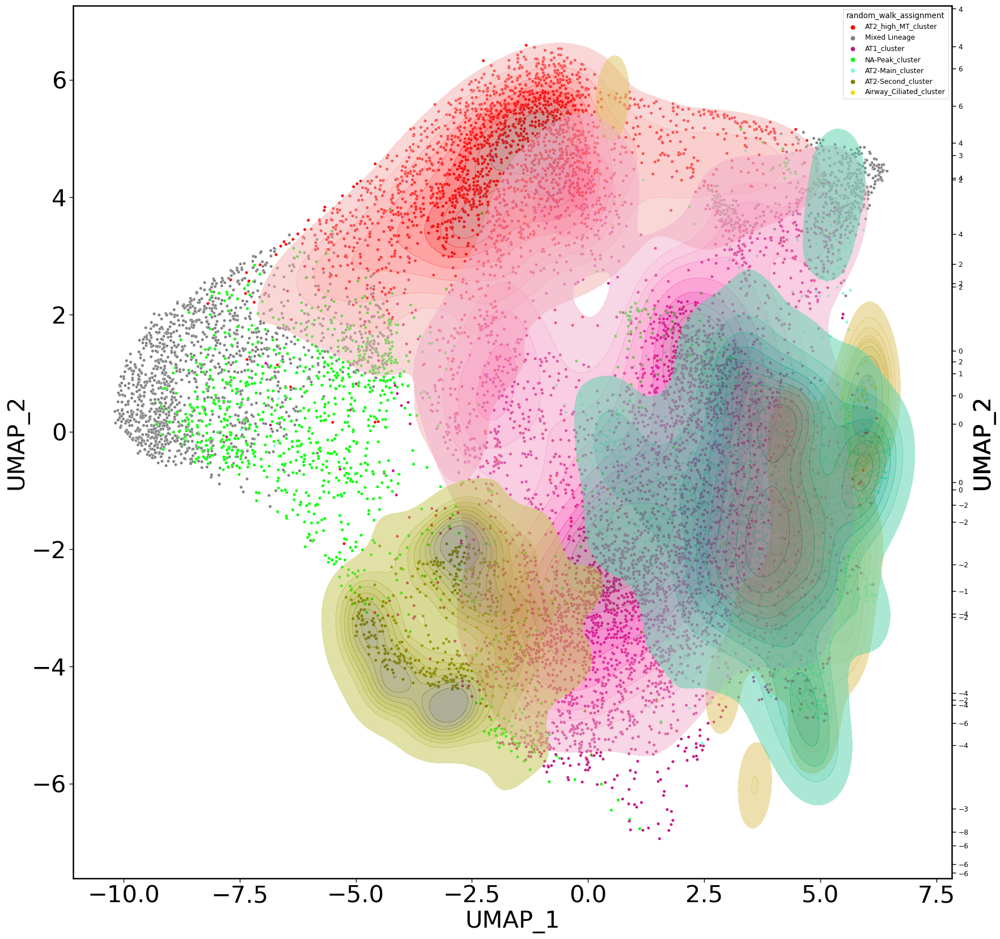

In [22]:
random_walk_graph = all_cells_umap[all_cells_umap.apply(lambda x: not filter_out(x), axis =1  )]

random_walk_graph = random_walk_graph[random_walk_graph["random_walk_assignment"] != "NA"]
#random_walk_graph = random_walk_graph[random_walk_graph["random_walk_assignment"] != "Mixed Lineage"]


matplotlib.rc_file_defaults()
plt.rcParams['figure.figsize']=(20,20)


palette = {
 "AT2_high_MT_cluster" : "#ff0000",
 "Airway_Ciliated_cluster": "#ffd700",
 "AT1_cluster": "#c71585",
 "AT2-Main_cluster": "#7fffd4", 
 "NA-Peak_cluster": "#00ff00",
 "AT2-Second_cluster": "#808000",
 "NA": "#808080",
 "Mixed Lineage": "#808080"

    
  
}
sns.set_context("paper", rc={"font.size":20,"axes.titlesize":30,"axes.labelsize":30})   
fig, ax = plt.subplots()

t = sns.scatterplot(data=random_walk_graph, x="UMAP_1", y="UMAP_2", hue="random_walk_assignment", ax=ax, palette=palette, s=15)
t.tick_params(labelsize=30)


ax2 = ax.twinx()
ax2 = sns.kdeplot(data= random_walk_graph[random_walk_graph["random_walk_assignment"] == "AT2_high_MT_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax2, linewidths=4, fill = True, color="#ff0000", alpha=0.5, bw=0.25)
t2.tick_params(labelsize=0)


ax2 = ax.twinx()
ax2 = sns.kdeplot(data= random_walk_graph[random_walk_graph["random_walk_assignment"] == "Airway_Ciliated_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax2, linewidths=4, fill = True, color="#ffd700", alpha=0.5, bw=0.25)
t2.tick_params(labelsize=0)




ax2 = ax.twinx()
ax2 = sns.kdeplot(data= random_walk_graph[random_walk_graph["random_walk_assignment"] == "AT1_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax2, linewidths=4, fill = True, color="#c71585", alpha=0.5, bw=0.25)
t2.tick_params(labelsize=0)



ax2 = ax.twinx()
ax2 = sns.kdeplot(data= random_walk_graph[random_walk_graph["random_walk_assignment"] == "AT2-Main_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax2, linewidths=4, fill = True, color="#7fffd4", alpha=0.5, bw=0.25)
t2.tick_params(labelsize=0)



ax2 = ax.twinx()
ax2 = sns.kdeplot(data= random_walk_graph[random_walk_graph["random_walk_assignment"] == "AT2-Second_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax2, linewidths=4, fill = True, color="#808000", alpha=0.5, bw=0.25)
t2.tick_params(labelsize=0)


#ax2 = ax.twinx()

#t2 = sns.kdeplot(data=ctrl_cell_only_umap, x="UMAP_1", y="UMAP_2", fill = False, ax = ax2, linewidths=4,  alpha=0.5, bw=0.15)

#t2.tick_params(labelsize=0)


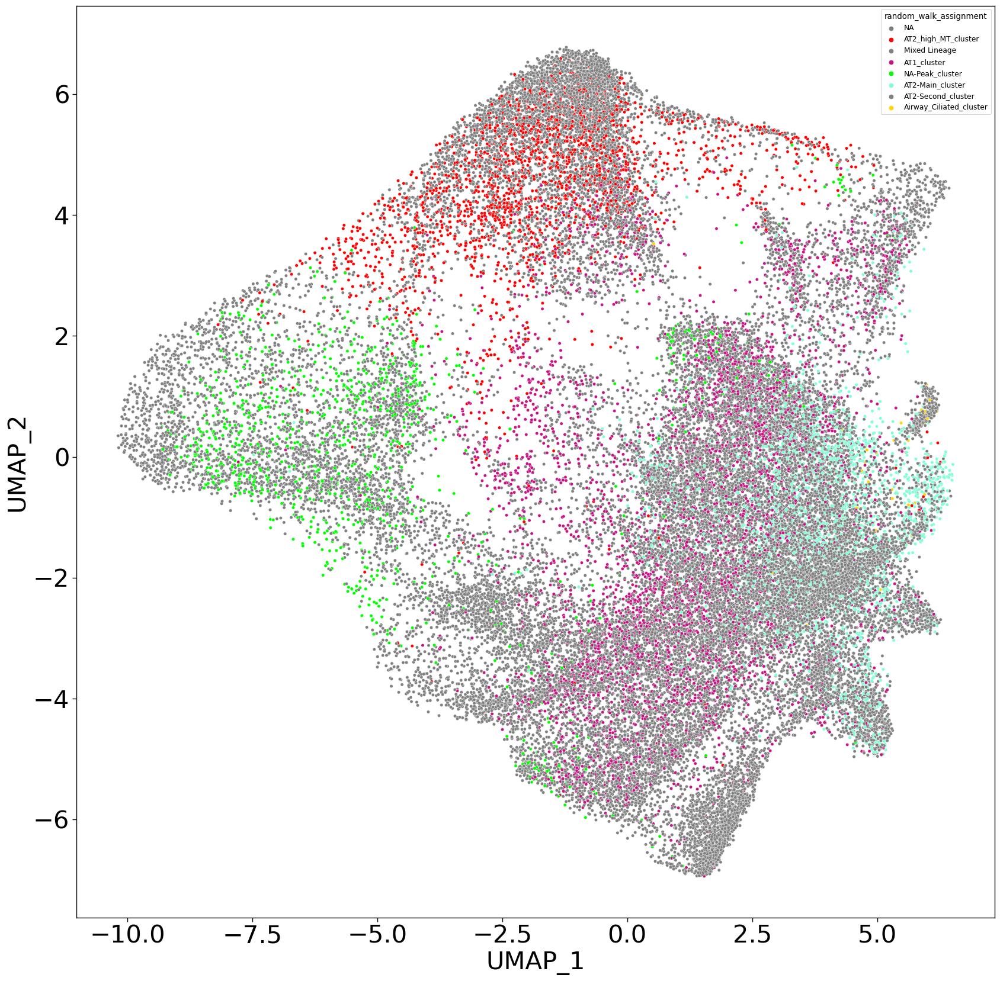

In [23]:
random_walk_graph = all_cells_umap[all_cells_umap.apply(lambda x: not filter_out(x), axis =1  )]

#random_walk_graph = random_walk_graph[random_walk_graph["random_walk_assignment"] != "NA"]
#random_walk_graph = random_walk_graph[random_walk_graph["random_walk_assignment"] != "Mixed Lineage"]


matplotlib.rc_file_defaults()
plt.rcParams['figure.figsize']=(20,20)


palette = {
 "AT2_high_MT_cluster" : "#ff0000",
 "Airway_Ciliated_cluster": "#ffd700",
 "AT1_cluster": "#c71585",
 "AT2-Main_cluster": "#7fffd4", 
 "NA-Peak_cluster": "#00ff00",
 "AT2-Second_cluster": "#808080",
 "NA": "#808080",
 "Mixed Lineage": "#808080"

    
  
}
sns.set_context("paper", rc={"font.size":20,"axes.titlesize":30,"axes.labelsize":30})   
fig, ax = plt.subplots()

t = sns.scatterplot(data=random_walk_graph, x="UMAP_1", y="UMAP_2", hue="random_walk_assignment", ax=ax, palette=palette, s=15)
t.tick_params(labelsize=30)




/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.25 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.25 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: Future

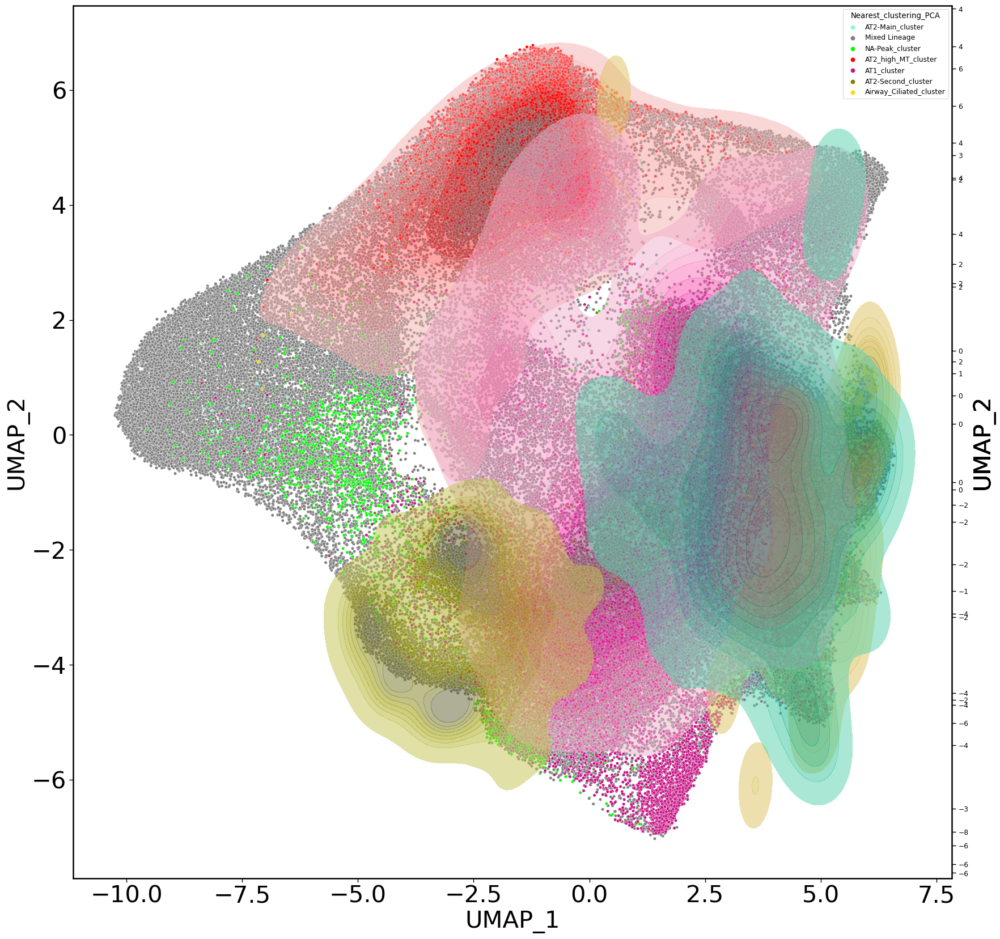

In [24]:
random_walk_graph = all_cells_umap[all_cells_umap.apply(lambda x: not filter_out(x), axis =1  )]

random_walk_graph = random_walk_graph[random_walk_graph["random_walk_assignment"] != "NA"]
#random_walk_graph = random_walk_graph[random_walk_graph["random_walk_assignment"] != "Mixed Lineage"]


matplotlib.rc_file_defaults()
plt.rcParams['figure.figsize']=(20,20)


palette = {
 "AT2_high_MT_cluster" : "#ff0000",
 "Airway_Ciliated_cluster": "#ffd700",
 "AT1_cluster": "#c71585",
 "AT2-Main_cluster": "#7fffd4", 
 "NA-Peak_cluster": "#00ff00",
 "AT2-Second_cluster": "#808000",
 "NA": "#808080",
 "Mixed Lineage": "#808080"

    
  
}
sns.set_context("paper", rc={"font.size":20,"axes.titlesize":30,"axes.labelsize":30})   
fig, ax = plt.subplots()

t = sns.scatterplot(data=all_cells_umap, x="UMAP_1", y="UMAP_2", hue="Nearest_clustering_PCA", ax=ax, palette=palette, s=15)
t.tick_params(labelsize=30)


ax2 = ax.twinx()
ax2 = sns.kdeplot(data= random_walk_graph[random_walk_graph["random_walk_assignment"] == "AT2_high_MT_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax2, linewidths=4, fill = True, color="#ff0000", alpha=0.5, bw=0.25)
t2.tick_params(labelsize=0)


ax2 = ax.twinx()
ax2 = sns.kdeplot(data= random_walk_graph[random_walk_graph["random_walk_assignment"] == "Airway_Ciliated_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax2, linewidths=4, fill = True, color="#ffd700", alpha=0.5, bw=0.25)
t2.tick_params(labelsize=0)




ax2 = ax.twinx()
ax2 = sns.kdeplot(data= random_walk_graph[random_walk_graph["random_walk_assignment"] == "AT1_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax2, linewidths=4, fill = True, color="#c71585", alpha=0.5, bw=0.25)
t2.tick_params(labelsize=0)



ax2 = ax.twinx()
ax2 = sns.kdeplot(data= random_walk_graph[random_walk_graph["random_walk_assignment"] == "AT2-Main_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax2, linewidths=4, fill = True, color="#7fffd4", alpha=0.5, bw=0.25)
t2.tick_params(labelsize=0)



ax2 = ax.twinx()
ax2 = sns.kdeplot(data= random_walk_graph[random_walk_graph["random_walk_assignment"] == "AT2-Second_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax2, linewidths=4, fill = True, color="#808000", alpha=0.5, bw=0.25)
t2.tick_params(labelsize=0)


#ax2 = ax.twinx()

#t2 = sns.kdeplot(data=ctrl_cell_only_umap, x="UMAP_1", y="UMAP_2", fill = False, ax = ax2, linewidths=4,  alpha=0.5, bw=0.15)

#t2.tick_params(labelsize=0)
plt.savefig("axis_labels.png", format="png", bbox_inches="tight") 

<AxesSubplot:xlabel='UMAP_1', ylabel='UMAP_2'>

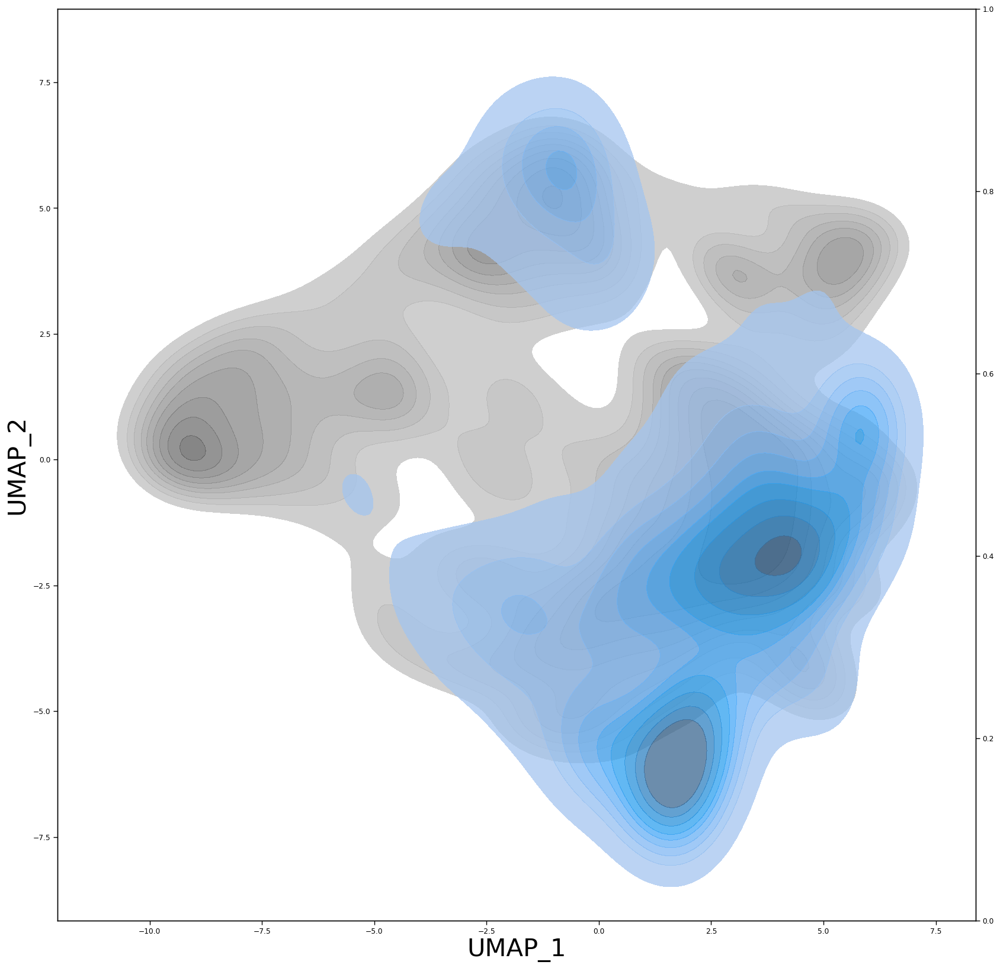

In [25]:
fig, ax = plt.subplots()

mixed_lineage_umap = all_cells_umap[all_cells_umap["Nearest_clustering_PCA"]== "Mixed Lineage"]
sns.kdeplot(data=mixed_lineage_umap, x="UMAP_1", y="UMAP_2", fill = True, color="#808080", ax = ax, alpha=.75)


ax2 = ax.twinx()


sns.kdeplot(data=ctrl_cell_only_umap, x="UMAP_1", y="UMAP_2", fill = True, ax = ax, alpha=.75)


In [26]:
assigned = all_cells_umap[all_cells_umap["Nearest_clustering_PCA"]!= "Mixed Lineage"]
assigned = assigned.sample(frac=0.1, replace=True, random_state=1)
new_rows_dict = dict(assigned.set_index("Unnamed: 0")["Nearest_clustering_PCA"])
new_rows_dict

{'Tumor_PA001_AGGGTGAAGATGAGAG-1': 'AT2_high_MT_cluster',
 'Tumor_PA125_GTTCGGGAGATGCGAC-1': Unnamed: 0
 Tumor_PA125_GTTCGGGAGATGCGAC-1    AT1_cluster
 Tumor_PA125_GTTCGGGAGATGCGAC-1    AT1_cluster
 Name: Nearest_clustering_PCA, dtype: object,
 'Tumor_PA054_CGCGTTTTCAAAGTAG-1': 'AT2_high_MT_cluster',
 'Tumor_STK_14_AAACCTGTCTGGGCCA-1': 'AT2_high_MT_cluster',
 'Tumor_PA104_AAGGAGCCATAGGATA-1': 'AT1_cluster',
 'Tumor_PA067_AGCATACTCCGGGTGT-1': 'AT1_cluster',
 'Tumor_STK_2_AAGGAGCTCTCTAGGA-1': 'AT1_cluster',
 'Tumor_KRAS_6_TGGCGCAGTCAGGACA-1': 'AT1_cluster',
 'Tumor_PA001_AACACGTAGAGGTTGC-1': 'AT2_high_MT_cluster',
 'Tumor_STK_22dot2_GCTGCTTTCTAACTTC-1': 'AT1_cluster',
 'Tumor_KRAS_10_CCTAGCTCAAGAGGCT-1': 'AT2-Main_cluster',
 'Tumor_PA067_TAGACCATCTCTAAGG-1': 'AT1_cluster',
 'Tumor_PA104_GGCGACTTCAATCACG-1': 'AT1_cluster',
 'Tumor_PA042_TCTATTGGTACTTCTT-1': 'AT1_cluster',
 'Control_TTGCCTGTCATAGCAC-1_2': 'AT1_cluster',
 'Tumor_KRAS_6_ACAGCCGAGCAGGTCA-1': 'AT1_cluster',
 'Tumor_KRAS_6_CTTG

In [27]:
random_walk = pd.read_csv("random_walk_prob_results.csv").set_index("rownames").drop("Unnamed: 0", axis = 1)
random_walk

,AT1_cluster,AT2_high_MT_cluster,AT2-Main_cluster,Mixed Lineage,NA-Peak_cluster,Airway_Ciliated_cluster,AT2-Second_cluster
rownames,,,,,,,
Tumor_PA001_TGTCCCAAGCTTCGCG-1,0.07,0.42,0.03,0.09,0.39,0.00,0.00
Tumor_PA004_GCCTCTACATGGTCTA-1,0.01,0.04,0.00,0.54,0.40,0.01,0.00
Tumor_PA004_AACTTTCTCTCGAGTA-1,0.00,1.00,0.00,0.00,0.00,0.00,0.00
Tumor_PA004_ACCAGTAAGCGCTCCA-1,0.47,0.00,0.42,0.00,0.01,0.02,0.08
Tumor_PA004_AGGTCATAGGCCCTTG-1,0.24,0.00,0.71,0.01,0.01,0.01,0.02
...,...,...,...,...,...,...,...
Control_GACTCAATCCGTTGGG-1_6,0.46,0.00,0.47,0.00,0.00,0.03,0.04
Control_GACATCACACTGTCCT-1_6,0.49,0.00,0.39,0.01,0.00,0.03,0.08
Control_TCCGATCAGTGCAACG-1_6,0.67,0.00,0.19,0.00,0.04,0.04,0.06


In [28]:
random_walk

,AT1_cluster,AT2_high_MT_cluster,AT2-Main_cluster,Mixed Lineage,NA-Peak_cluster,Airway_Ciliated_cluster,AT2-Second_cluster
rownames,,,,,,,
Tumor_PA001_TGTCCCAAGCTTCGCG-1,0.07,0.42,0.03,0.09,0.39,0.00,0.00
Tumor_PA004_GCCTCTACATGGTCTA-1,0.01,0.04,0.00,0.54,0.40,0.01,0.00
Tumor_PA004_AACTTTCTCTCGAGTA-1,0.00,1.00,0.00,0.00,0.00,0.00,0.00
Tumor_PA004_ACCAGTAAGCGCTCCA-1,0.47,0.00,0.42,0.00,0.01,0.02,0.08
Tumor_PA004_AGGTCATAGGCCCTTG-1,0.24,0.00,0.71,0.01,0.01,0.01,0.02
...,...,...,...,...,...,...,...
Control_GACTCAATCCGTTGGG-1_6,0.46,0.00,0.47,0.00,0.00,0.03,0.04
Control_GACATCACACTGTCCT-1_6,0.49,0.00,0.39,0.01,0.00,0.03,0.08
Control_TCCGATCAGTGCAACG-1_6,0.67,0.00,0.19,0.00,0.04,0.04,0.06


In [29]:
for key, value in new_rows_dict.items():
    if key not in random_walk.index:
        # Initialize row with zeros
        new_row = pd.Series({col: 0 for col in random_walk.columns}, name=key)
        # Set the specific column to 1
        new_row[value] = 1
        # Append the row to the DataFrame
        random_walk = random_walk.append(new_row)


/tmp/ipykernel_1132/1771822865.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  random_walk = random_walk.append(new_row)
/tmp/ipykernel_1132/1771822865.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  random_walk = random_walk.append(new_row)
/tmp/ipykernel_1132/1771822865.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  random_walk = random_walk.append(new_row)
/tmp/ipykernel_1132/1771822865.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  random_walk = random_walk.append(new_row)
/tmp/ipykernel_1132/1771822865.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. U

In [30]:
random_walk.to_csv("Random_walk_prob_control.csv")

In [31]:
random_walk

,AT1_cluster,AT2_high_MT_cluster,AT2-Main_cluster,Mixed Lineage,NA-Peak_cluster,Airway_Ciliated_cluster,AT2-Second_cluster
rownames,,,,,,,
Tumor_PA001_TGTCCCAAGCTTCGCG-1,0.07,0.42,0.03,0.09,0.39,0.00,0.00
Tumor_PA004_GCCTCTACATGGTCTA-1,0.01,0.04,0.00,0.54,0.40,0.01,0.00
Tumor_PA004_AACTTTCTCTCGAGTA-1,0.00,1.00,0.00,0.00,0.00,0.00,0.00
Tumor_PA004_ACCAGTAAGCGCTCCA-1,0.47,0.00,0.42,0.00,0.01,0.02,0.08
Tumor_PA004_AGGTCATAGGCCCTTG-1,0.24,0.00,0.71,0.01,0.01,0.01,0.02
...,...,...,...,...,...,...,...
Tumor_PA034_TCGGGACTCTGACCTC-1,0.00,0.00,1.00,0.00,0.00,0.00,0.00
Tumor_PA070_CGTCCATCACAGGCCT-1,1.00,0.00,0.00,0.00,0.00,0.00,0.00
Tumor_PA054_TGACTTTGTCAAAGAT-1,0.00,0.00,1.00,0.00,0.00,0.00,0.00


In [32]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.decomposition import PCA

# Assuming df is your DataFrame already loaded with the correct index

# Clustering using K-means
k = 20  # Number of clusters; adjust based on your data or domain knowledge
kmeans = KMeans(n_clusters=k, n_init=10, random_state=0).fit(random_walk)

# Assign clusters back to the DataFrame
random_walk['Cluster'] = kmeans.labels_

# Calculate centroids
centroids = kmeans.cluster_centers_
centroids
#np.save("centroids_kmeans.pkl", centroids)


array([[1.18207088e-02, 9.68526755e-01, 2.68936762e-03, 1.06532314e-02,
        5.05211953e-03, 9.24252953e-04, 3.33564976e-04],
       [5.96157706e-01, 1.76344086e-02, 2.74293907e-01, 1.36989247e-02,
        1.99139785e-02, 3.78136201e-02, 4.04874552e-02],
       [1.04180064e-02, 9.31832797e-02, 3.19935691e-03, 5.44389068e-01,
        3.42524116e-01, 5.62700965e-04, 5.72347267e-03],
       [2.65173469e-01, 1.58163265e-03, 6.69112245e-01, 4.64285714e-03,
        3.69387755e-03, 4.58367347e-02, 9.95918367e-03],
       [7.05714286e-01, 1.25595238e-02, 7.87202381e-02, 1.82366071e-02,
        4.10863095e-02, 9.79910714e-03, 1.33883929e-01],
       [6.75739645e-03, 1.67573964e-02, 6.98224852e-03, 9.02260355e-01,
        6.56804734e-02, 3.55029586e-04, 1.20710059e-03],
       [3.48523985e-01, 4.77859779e-03, 3.00184502e-02, 4.38560886e-02,
        9.69557196e-02, 1.90036900e-03, 4.73966790e-01],
       [9.85216522e-01, 1.06595603e-04, 4.77015323e-03, 4.06395736e-04,
        2.62491672e-03, 3

In [33]:
cluster_sizes = random_walk['Cluster'].value_counts()
pca = PCA(n_components=2, random_state=0)
centroids_reduced_pca = pca.fit_transform(centroids)

In [34]:
centroids_reduced_pca

array([[ 0.51510371, -0.05731219],
       [-0.37653409, -0.15104292],
       [ 0.41289321,  0.09170332],
       [-0.4109619 ,  0.3307693 ],
       [-0.33445279, -0.38066686],
       [ 0.4257807 ,  0.17676611],
       [-0.10766939, -0.2749093 ],
       [-0.46702094, -0.57506669],
       [ 0.34869463, -0.00881805],
       [ 0.33755435, -0.01811519],
       [-0.43436533,  0.70144539],
       [ 0.01518563,  0.29324034],
       [ 0.01909449, -0.21427034],
       [ 0.11547337,  0.10223012],
       [-0.10813315, -0.2223071 ],
       [ 0.23977798, -0.02082744],
       [-0.199225  ,  0.3888492 ],
       [ 0.01957614, -0.17353118],
       [ 0.37863659, -0.08056846],
       [-0.38940819,  0.09243195]])

In [35]:



palette = {
 "AT2_high_MT_cluster" : "#ff0000",
 "Airway_Ciliated_cluster": "#ffd700",
 "AT1_cluster": "#c71585",
 "AT2-Main_cluster": "#7fffd4", 
 "NA-Peak_cluster": "#00ff00",
 "AT2-Second_cluster": "#808000",
 "NA": "#808080",
 "Mixed Lineage": "#808080"}


    
    
#18 = "#808000"
#9 = "#00ff00"
#0 = "#ff0000"
#11 = #7fffd4
#19 = #ffd700
#16 = #00ff00
#all other clusters = #808080
# Color mapping based on your specific cluster IDs


color_map = {
    2: "#ff0000",
    10: "#ffd700",
    12: "#c71585",
    6: "#7fffd4",
    14: "#00ff00",
}
print( set(random_walk[random_walk["AT2_high_MT_cluster"] == 1]["Cluster"]))

print( set(random_walk[random_walk["Airway_Ciliated_cluster"] == 1]["Cluster"]))

print( set(random_walk[random_walk["AT1_cluster"] == 1]["Cluster"]))

print( set(random_walk[random_walk["AT2-Main_cluster"] == 1]["Cluster"]))

print( set(random_walk[random_walk["NA-Peak_cluster"] == 1]["Cluster"]))

default_color = "#808080"



{0}
{11}
{7}
{10}
{9}


In [36]:
PCAs = pd.read_csv("PCA_random_walk_cells.csv").set_index("Unnamed: 0")

PCAs
centroids_reduced_pca = []

for i in list(set(kmeans.labels_)):
    cells_1 = random_walk[random_walk["Cluster"] == i].index
    vals_1 = PCAs[PCAs.index.isin(cells_1)].mean()
    centroids_reduced_pca.append([vals_1["PC_1"], vals_1["PC_2"]])
centroids_reduced_pca = np.array(centroids_reduced_pca)
centroids_reduced_pca

array([[ 1.14251413, 10.0992272 ],
       [-3.3635037 , -1.27132784],
       [13.45331187,  0.14354058],
       [-4.34183676, -1.89973133],
       [-3.5757854 , -2.41336268],
       [22.1872987 , -3.65480195],
       [-0.6274569 , -3.47954873],
       [-2.98310375, -1.63611208],
       [ 5.3660231 ,  5.50536163],
       [ 3.95307739, -2.01445501],
       [-3.43544779, -1.42662185],
       [-3.83979469, -0.76033546],
       [-0.99129968, -3.16516016],
       [-3.99264621, -0.06303648],
       [-0.73572389, -1.06796943],
       [ 5.46179043, -1.61144906],
       [-4.84214916, -1.18641817],
       [-0.5713561 ,  3.84201558],
       [ 1.88915635,  6.79939991],
       [-3.93802418, -1.71469857]])

In [37]:
from scipy.stats import gaussian_kde

def get_x_y(x, y):
    data = np.vstack([x, y])

    # Perform Kernel Density Estimation
    kde = gaussian_kde(data)

    # Define the grid over which we will evaluate kde
    grid_x = np.linspace(min(x), max(x), 100)
    grid_y = np.linspace(min(y), max(y), 100)
    grid_x, grid_y = np.meshgrid(grid_x, grid_y)

    # Evaluate the KDE on this grid
    grid_coords = np.vstack([grid_x.ravel(), grid_y.ravel()])
    density = kde(grid_coords).reshape(grid_x.shape)

    # Find the coordinates of the highest density point
    highest_density_idx = np.argmax(density)
    highest_density_point = (grid_x.ravel()[highest_density_idx], grid_y.ravel()[highest_density_idx])
    return highest_density_point

centroids_reduced = []
for x in set(kmeans.labels_):
    filt = all_cells_umap[all_cells_umap["Unnamed..0"].isin(
        random_walk[random_walk["Cluster"] == x].index)]
    centroids_reduced.append(get_x_y(filt["UMAP_1"], filt["UMAP_2"]))
    
centroids_reduced = np.array(centroids_reduced)

In [38]:
all_cells_umap

,Unnamed: 0,UMAP_1,UMAP_2,Unnamed..0,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rps,percent.rpl,...,long__AT21,long__AEP1,devST__GO_LUNG_EPITHELIUM_DEVELOPMENT1,devST__ASC_SMITH_CELL20181,devST__HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION1,devST__CELLULAR_MORPHOGENESIS_DURING_DIFFERENTIATION1,devST__AEP_MORRISEY_2FC1,devST__Cluster_211,Nearest_clustering_PCA,random_walk_assignment
0,Tumor_PA001_GCGAGAAGTACTTAGC-1,5.354099,3.561673,Tumor_PA001_GCGAGAAGTACTTAGC-1,PA001,20491,6976,0.590503,0.214728,0.175687,...,-0.178013,-0.047405,0.052140,0.112372,-0.080815,-0.035106,-0.047405,-0.036322,AT2-Main_cluster,NA
1,Tumor_PA001_TCGGTAAAGGCAAAGA-1,-3.645893,1.415579,Tumor_PA001_TCGGTAAAGGCAAAGA-1,PA001,18659,5631,1.045072,0.117906,0.123265,...,-0.102699,-0.074431,-0.162698,0.115103,0.469005,0.136763,-0.074431,0.949425,Mixed Lineage,NA
2,Tumor_PA001_CTCTAATCATGAGCGA-1,-3.503106,1.315840,Tumor_PA001_CTCTAATCATGAGCGA-1,PA001,17974,5562,0.867920,0.139090,0.127963,...,-0.103924,-0.083075,-0.150325,0.128260,0.444857,0.146910,-0.083075,0.859209,NA-Peak_cluster,NA
3,Tumor_PA001_CTTTGCGAGACTGTAA-1,-3.230189,1.323353,Tumor_PA001_CTTTGCGAGACTGTAA-1,PA001,11223,4085,1.603849,0.115834,0.115834,...,-0.042421,-0.077642,-0.112827,0.135398,0.334996,0.205437,-0.077642,0.897070,NA-Peak_cluster,NA
4,Tumor_PA001_GTTACAGTCCAGAGGA-1,-3.514193,3.114983,Tumor_PA001_GTTACAGTCCAGAGGA-1,PA001,9885,4203,1.406171,0.060698,0.091047,...,-0.071911,-0.102458,-0.113801,0.196323,0.239882,0.058628,-0.102458,0.830591,AT2_high_MT_cluster,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151390,Control_TCCATGCAGCTCGACC-1_6,4.920003,-1.126681,Control_TCCATGCAGCTCGACC-1_6,C57ctr,798,586,0.000000,0.000000,0.000000,...,0.363772,0.247161,0.254186,-0.021936,-0.061527,-0.034345,0.247161,-0.113703,Mixed Lineage,AT2-Main_cluster
151391,Control_TGCTTGCGTTGGAGAC-1_6,-1.836780,-4.387973,Control_TGCTTGCGTTGGAGAC-1_6,C57ctr,806,622,0.000000,0.000000,0.000000,...,-0.074064,0.186381,0.099152,-0.064695,0.024299,0.009602,0.186381,0.019884,AT1_cluster,NA
151392,Control_ACTGATGGTCTTGAGT-1_6,3.718128,-1.935767,Control_ACTGATGGTCTTGAGT-1_6,C57ctr,807,553,0.000000,0.123916,0.000000,...,0.395134,0.218668,-0.157487,0.197324,-0.035513,0.135662,0.218668,-0.057631,AT2-Main_cluster,NA
151393,Control_TGCTCCAAGACATACA-1_6,-0.922793,6.221123,Control_TGCTCCAAGACATACA-1_6,C57ctr,811,653,4.932182,0.123305,0.000000,...,0.267052,0.158625,-0.085001,0.217193,-0.017561,0.124934,0.158625,-0.010431,AT2_high_MT_cluster,NA


In [39]:
filt = all_cells_umap[all_cells_umap["Unnamed..0"].isin(
        random_walk[random_walk["Cluster"] == x].index)]
filt

,Unnamed: 0,UMAP_1,UMAP_2,Unnamed..0,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.rps,percent.rpl,...,long__AT21,long__AEP1,devST__GO_LUNG_EPITHELIUM_DEVELOPMENT1,devST__ASC_SMITH_CELL20181,devST__HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION1,devST__CELLULAR_MORPHOGENESIS_DURING_DIFFERENTIATION1,devST__AEP_MORRISEY_2FC1,devST__Cluster_211,Nearest_clustering_PCA,random_walk_assignment
416,Tumor_PA004_CACCAGGTCGAGAACG-1,2.803998,1.068860,Tumor_PA004_CACCAGGTCGAGAACG-1,PA004,17571,5810,1.815491,0.165045,0.096750,...,0.485194,0.342347,0.074704,0.049018,-0.011025,0.036275,0.342347,-0.119065,Mixed Lineage,AT1_cluster
817,Tumor_PA004_AAGTCTGTCACGATGT-1,4.090739,-2.288651,Tumor_PA004_AAGTCTGTCACGATGT-1,PA004,11333,4550,0.008824,0.167652,0.000000,...,0.264444,0.317566,0.063963,0.036675,-0.058165,0.032274,0.317566,-0.208698,Mixed Lineage,AT2-Main_cluster
896,Tumor_PA004_GTACTTTAGCCCAACC-1,4.968577,3.482637,Tumor_PA004_GTACTTTAGCCCAACC-1,PA004,10657,4383,0.065685,0.046918,0.028151,...,0.280035,0.293966,0.051964,-0.005820,-0.031213,-0.024697,0.293966,-0.173716,Mixed Lineage,AT1_cluster
1336,Tumor_PA004_GCAATCACATCTGGTA-1,2.054556,0.178310,Tumor_PA004_GCAATCACATCTGGTA-1,PA004,8451,3689,0.934801,0.177494,0.023666,...,0.442181,0.263520,-0.014196,0.047677,-0.019015,0.013517,0.263520,-0.152638,Mixed Lineage,AT1_cluster
1381,Tumor_PA004_CTGTTTAGTAGCGTCC-1,2.372860,-1.516161,Tumor_PA004_CTGTTTAGTAGCGTCC-1,PA004,8305,3574,1.493076,0.108368,0.108368,...,0.468163,0.337799,0.180794,-0.041355,-0.006535,0.048664,0.337799,-0.142187,Mixed Lineage,AT2-Main_cluster
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150475,Control_GACTCAATCCGTTGGG-1_6,4.218531,-2.554461,Control_GACTCAATCCGTTGGG-1_6,C57ctr,1344,903,0.074405,0.074405,0.000000,...,0.543450,0.389424,0.022036,-0.034967,-0.062674,-0.091219,0.389424,-0.156095,Mixed Lineage,AT2-Main_cluster
150651,Control_AGCCAGCCAACACAGG-1_6,4.979255,-2.496765,Control_AGCCAGCCAACACAGG-1_6,C57ctr,1200,798,0.000000,0.000000,0.000000,...,0.469308,0.286326,-0.018726,-0.031271,-0.045034,0.062842,0.286326,-0.107464,Mixed Lineage,AT1_cluster
150695,Control_ATTCCTATCATCAGTG-1_6,5.336286,3.732340,Control_ATTCCTATCATCAGTG-1_6,C57ctr,1204,826,0.000000,0.083056,0.000000,...,0.379673,0.275387,-0.021237,-0.000488,-0.045353,-0.009517,0.275387,-0.100482,Mixed Lineage,AT2-Main_cluster
150806,Control_TGAACGTAGAAGAACG-1_6,4.774163,-1.365167,Control_TGAACGTAGAAGAACG-1_6,C57ctr,1121,825,0.000000,0.089206,0.000000,...,0.429567,0.293093,0.034127,0.107687,-0.064938,0.156766,0.293093,-0.039779,Mixed Lineage,AT1_cluster


In [40]:
# Create a graph
G = nx.Graph()


# Add nodes - each node is a cluster
for i in range(k):
    G.add_node(i, pos=centroids_reduced[i], size=cluster_sizes[i]*20, color=color_map.get(i, default_color))

# Define connectivity - connect all clusters, weight edges by inverse of distance between centroids
for i in list((color_map).keys()):
    for j in list((color_map).keys()):
        weight = np.linalg.norm(centroids_reduced_pca[i] - centroids_reduced_pca[j])
        if weight < 20  and weight >0:
            G.add_edge(i, j, weight=1 / weight)

# Draw the network
pos = nx.get_node_attributes(G, 'pos')
sizes = [G.nodes[i]['size'] for i in G.nodes]
colors = [G.nodes[i]['color'] for i in G.nodes]
# Draw labels for edges
labels = nx.get_edge_attributes(G, 'weight')
edges = G.edges()
weights = [G[u][v]['weight'] for u, v in G.edges() if u != v]

# Separate nodes by color for drawing order
default_nodes = [n for n, attr in G.nodes(data=True) if attr['color'] == default_color]
colored_nodes = [n for n, attr in G.nodes(data=True) if attr['color'] != default_color]

In [41]:
random_walk_graph_match = random_walk_graph.copy()
#random_walk_graph_match["UMAP_1"] = random_walk_graph_match["UMAP_1"] *1.5
random_walk_graph_match["UMAP_2"] = random_walk_graph_match["UMAP_2"] 

In [42]:
node_labels_2_key = {
    1:12,
    2:2,
    3:10,
    4:11,
    5:9,
    6:14,
    7:13,
    8:7,
    9:1,
    10:3,
    11:5,
    12:8,
    13:4,
    14:15,
    15:6}
node_labels = {node: str(node_labels_2_key[i+1]) for i, node in enumerate(default_nodes)}
#node_labels = {node: str(i+1) for i, node in enumerate(default_nodes)}


average_df = {}
for x in node_labels.keys():
    filtered_df = random_walk[random_walk["Cluster"] == x]
    average_df[int(node_labels[x])] = filtered_df.mean()
probability_df = pd.DataFrame(average_df).T.drop("Cluster", axis = 1)
#probability_df.to_csv("LabeledClusterProbabilities.csv")

nodes = ["AT2_high_MT_cluster", "Airway_Ciliated_cluster", "AT1_cluster",
        "AT2-Main_cluster", "NA-Peak_cluster"]


random_walk[random_walk["AT2_high_MT_cluster"] == 1]["Cluster"]


new_dict = {
    list(color_map.keys())[0]: "AT2_high_MT_cluster",
    list(color_map.keys())[1]: "Airway_Ciliated_cluster",
    list(color_map.keys())[2]: "AT1_cluster",
    list(color_map.keys())[3]: "AT2-Main_cluster",
    list(color_map.keys())[4]: "NA-Peak_cluster",
}
df_edge_distances = []
# Define connectivity - connect all clusters, weight edges by inverse of distance between centroids
for i in list((color_map).keys()):
    for j in list((color_map).keys()):
        weight = np.linalg.norm(centroids_reduced_pca[i] - centroids_reduced_pca[j])
        df_edge_distances.append([new_dict[i], new_dict[j], weight])
#pd.DataFrame(df_edge_distances).to_csv("PrimaryNodeDistances.csv")



In [43]:
list(color_map.keys())[0]

2

In [44]:
#named_columns = random_walk[random_walk["Cluster"].isin(list((color_map).keys()))]

#named_columns.replace({"Cluster": new_dict}).to_csv("major_nodes_random_walk_results.csv")

#unnamed_columns = random_walk[~random_walk["Cluster"].isin(list((color_map).keys()))]

#unnamed_columns.replace({"Cluster": node_labels}).to_csv("mixed_nodes_random_walk_results.csv")


#named_columns.replace({"Cluster": new_dict}).append(unnamed_columns.replace({"Cluster": node_labels})).to_csv("all_nodes_random_walk_results.csv")

In [45]:
cluster_21_cells = pd.read_csv("Cluster_21.csv")
cluster_21_cells["Unnamed: 0"] = cluster_21_cells.apply(lambda x: "Tumor_" + x["Unnamed: 0"], axis = 1)
cluster_21 = all_cells_umap[all_cells_umap['Unnamed: 0'].isin(cluster_21_cells["Unnamed: 0"])]



G.add_node(21, pos=get_x_y(cluster_21['UMAP_1'], cluster_21['UMAP_1']), 
           size=len(cluster_21)/10, color=color_map.get(i, default_color))
pos[21] =get_x_y(cluster_21['UMAP_1'], cluster_21['UMAP_1'])

In [46]:
pos

{0: array([-1.07997416,  5.67105932]),
 1: array([2.57685119, 0.7424758 ]),
 2: array([-4.77764697,  1.44863806]),
 3: array([ 3.9275491 , -1.83535854]),
 4: array([ 0.14762981, -2.94664859]),
 5: array([-9.17830258,  0.14975666]),
 6: array([-2.5934576 , -3.99748153]),
 7: array([ 0.8060108 , -4.45731755]),
 8: array([-5.40888557,  3.08745066]),
 9: array([-5.55595833, -0.2444559 ]),
 10: array([ 4.02525588, -1.87807763]),
 11: array([5.7922832 , 0.64546035]),
 12: array([-2.90207823, -2.41645647]),
 13: array([5.62356157, 3.95184628]),
 14: array([-2.40972195, -0.07635187]),
 15: array([-7.3326146 ,  0.44597736]),
 16: array([ 5.95039693, -0.65841838]),
 17: array([-0.44988116,  3.91377044]),
 18: array([-2.61074333,  4.07291398]),
 19: array([3.19803635, 0.23434353]),
 21: (-1.743016912294875, -1.743016912294875)}

In [47]:
default_nodes

[0, 1, 3, 4, 5, 7, 8, 9, 11, 13, 15, 16, 17, 18, 19]

In [48]:
pos


{0: array([-1.07997416,  5.67105932]),
 1: array([2.57685119, 0.7424758 ]),
 2: array([-4.77764697,  1.44863806]),
 3: array([ 3.9275491 , -1.83535854]),
 4: array([ 0.14762981, -2.94664859]),
 5: array([-9.17830258,  0.14975666]),
 6: array([-2.5934576 , -3.99748153]),
 7: array([ 0.8060108 , -4.45731755]),
 8: array([-5.40888557,  3.08745066]),
 9: array([-5.55595833, -0.2444559 ]),
 10: array([ 4.02525588, -1.87807763]),
 11: array([5.7922832 , 0.64546035]),
 12: array([-2.90207823, -2.41645647]),
 13: array([5.62356157, 3.95184628]),
 14: array([-2.40972195, -0.07635187]),
 15: array([-7.3326146 ,  0.44597736]),
 16: array([ 5.95039693, -0.65841838]),
 17: array([-0.44988116,  3.91377044]),
 18: array([-2.61074333,  4.07291398]),
 19: array([3.19803635, 0.23434353]),
 21: (-1.743016912294875, -1.743016912294875)}

/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWa

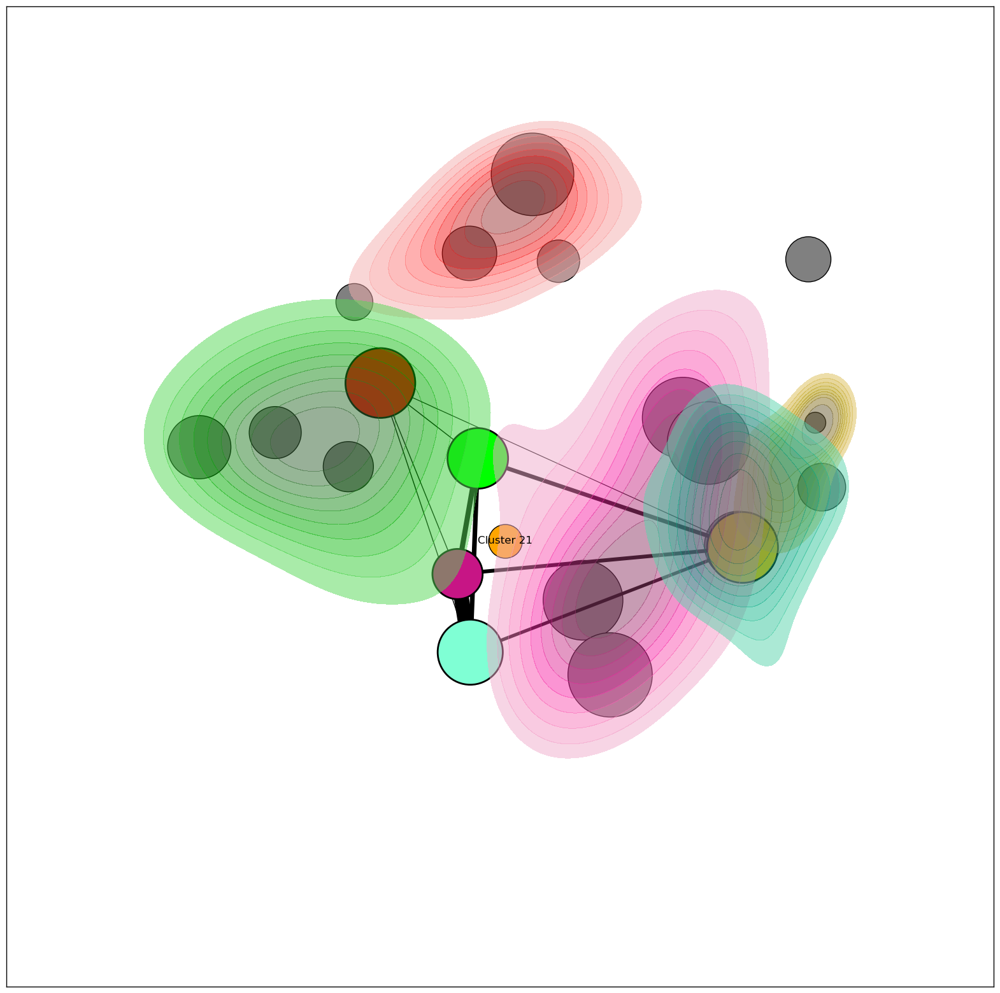

In [49]:
plt.rcParams['figure.figsize']=(20,20)

fig, ax = plt.subplots()

#nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=12, font_color='k', ax=ax)

col = nx.draw_networkx_nodes(G, pos, nodelist=default_nodes, node_size=[sizes[n]/3.3 for n in default_nodes],
                       node_color=[colors[n] for n in default_nodes], edgecolors='k', linewidths = 1, ax = ax)
col.set_zorder(-2)

col = nx.draw_networkx_nodes(G, pos, nodelist=[21], node_size=[len(cluster_21)*2/3.3],
                       node_color=["#FFA500"], edgecolors='k', linewidths = 1, ax = ax)
node_labels = {21: "Cluster 21"}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=12, font_color='k', ax=ax)

col.set_zorder(0)

col= nx.draw_networkx_nodes(G, pos, nodelist=colored_nodes, node_size=[sizes[n]/2 for n in colored_nodes],
                       node_color=[colors[n] for n in colored_nodes], edgecolors='k',linewidths = 2, ax = ax)
col.set_zorder(-1)

edges = G.edges(data=True)
weights = np.log([e[2]['weight']+1 for e in edges])*15# Scale by 2 for visibility, adjust as needed
weights[weights > 1e2] = 1e2
col=  nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights, ax = ax)
col.set_zorder(-1.5)
ax.axis("on")

x_ticks = np.linspace(min(pos[n][0] for n in G), max(pos[n][0] for n in G), 5)  # Adjust these values as needed
y_ticks = np.linspace(min(pos[n][1] for n in G), max(pos[n][1] for n in G), 5)  # Adjust these values as needed



sns.kdeplot(data= random_walk_graph_match[random_walk_graph_match["random_walk_assignment"] == "AT2_high_MT_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax,thresh=.3, linewidths=4, fill = True, color="#ff0000", alpha=0.5, bw=0.5)

sns.kdeplot(data= random_walk_graph_match[random_walk_graph_match["random_walk_assignment"] == "Airway_Ciliated_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax, thresh=.3,linewidths=4, fill = True, color="#ffd700", alpha=0.5, bw=0.5)


sns.kdeplot(data= random_walk_graph_match[random_walk_graph_match["random_walk_assignment"] == "AT1_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax,thresh=.3, linewidths=4, fill = True, color="#c71585", alpha=0.5, bw=0.5)

sns.kdeplot(data= random_walk_graph_match[random_walk_graph_match["random_walk_assignment"] == "AT2-Main_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax, thresh=.3,linewidths=4, fill = True, color="#7fffd4", alpha=0.5, bw=0.5)

sns.kdeplot(data= random_walk_graph_match[random_walk_graph_match["random_walk_assignment"] == "NA-Peak_cluster"]
                  , x="UMAP_1", y="UMAP_2", ax = ax,thresh=.3,linewidths=4, fill = True, color="#00ff00", alpha=0.5, bw=0.5)
ax.set_xticks(x_ticks)
ax.set_yticks(y_ticks)

# Optionally, set custom labels (here, rounded positions as labels)
ax.set_xticklabels([f"{x:.2f}" for x in x_ticks])
ax.set_yticklabels([f"{y:.2f}" for y in y_ticks])

fig.savefig("cluster_21_network.pdf")

plt.show()



In [50]:
list(G.nodes(data=True))

[(0,
  {'pos': array([-1.07997416,  5.67105932]),
   'size': 28780,
   'color': '#808080'}),
 (1,
  {'pos': array([2.57685119, 0.7424758 ]), 'size': 27880, 'color': '#808080'}),
 (2,
  {'pos': array([-4.77764697,  1.44863806]),
   'size': 12440,
   'color': '#ff0000'}),
 (3,
  {'pos': array([ 3.9275491 , -1.83535854]),
   'size': 19600,
   'color': '#808080'}),
 (4,
  {'pos': array([ 0.14762981, -2.94664859]),
   'size': 26840,
   'color': '#808080'}),
 (5,
  {'pos': array([-9.17830258,  0.14975666]),
   'size': 16900,
   'color': '#808080'}),
 (6,
  {'pos': array([-2.5934576 , -3.99748153]),
   'size': 10840,
   'color': '#7fffd4'}),
 (7,
  {'pos': array([ 0.8060108 , -4.45731755]),
   'size': 30000,
   'color': '#808080'}),
 (8,
  {'pos': array([-5.40888557,  3.08745066]),
   'size': 5760,
   'color': '#808080'}),
 (9,
  {'pos': array([-5.55595833, -0.2444559 ]),
   'size': 10640,
   'color': '#808080'}),
 (10,
  {'pos': array([ 4.02525588, -1.87807763]),
   'size': 12820,
   'color'

In [51]:
node_labels_2_key = {
    1:12,
    2:2,
    3:10,
    4:11,
    5:9,
    6:14,
    7:13,
    8:7,
    9:1,
    10:3,
    11:5,
    12:8,
    13:4,
    14:15,
    15:6}
node_labels = {node: str(node_labels_2_key[i+1]) for i, node in enumerate(default_nodes)}


In [52]:
size = {}
for x in default_nodes:
    size[node_labels[x]] = G.nodes[x]["size"]/20
sizes = []
for x in probability_df.index:
    sizes.append(size[str(x)])
probability_df['size'] = sizes
probability_df

,AT1_cluster,AT2_high_MT_cluster,AT2-Main_cluster,Mixed Lineage,NA-Peak_cluster,Airway_Ciliated_cluster,AT2-Second_cluster,size
12,0.011821,0.968527,0.002689,0.010653,0.005052,0.000924,0.000334,1439.0
2,0.596528,0.017647,0.274089,0.013723,0.019892,0.037776,0.040344,1394.0
10,0.265173,0.001582,0.669112,0.004643,0.003694,0.045837,0.009959,980.0
11,0.705984,0.012586,0.078577,0.018234,0.041051,0.009814,0.133756,1342.0
9,0.006757,0.016757,0.006982,0.902260,0.065680,0.000355,0.001207,845.0
14,0.985313,0.000100,0.004740,0.000393,0.002607,0.000313,0.006533,1500.0
13,0.091979,0.429479,0.034444,0.235833,0.197118,0.007708,0.003438,288.0
7,0.029323,0.011353,0.017162,0.020714,0.910733,0.000846,0.009868,532.0
1,0.007419,0.000645,0.027097,0.002366,0.000215,0.961935,0.000323,93.0
3,0.200812,0.080858,0.162065,0.532042,0.007169,0.016729,0.000325,431.0


<AxesSubplot:>

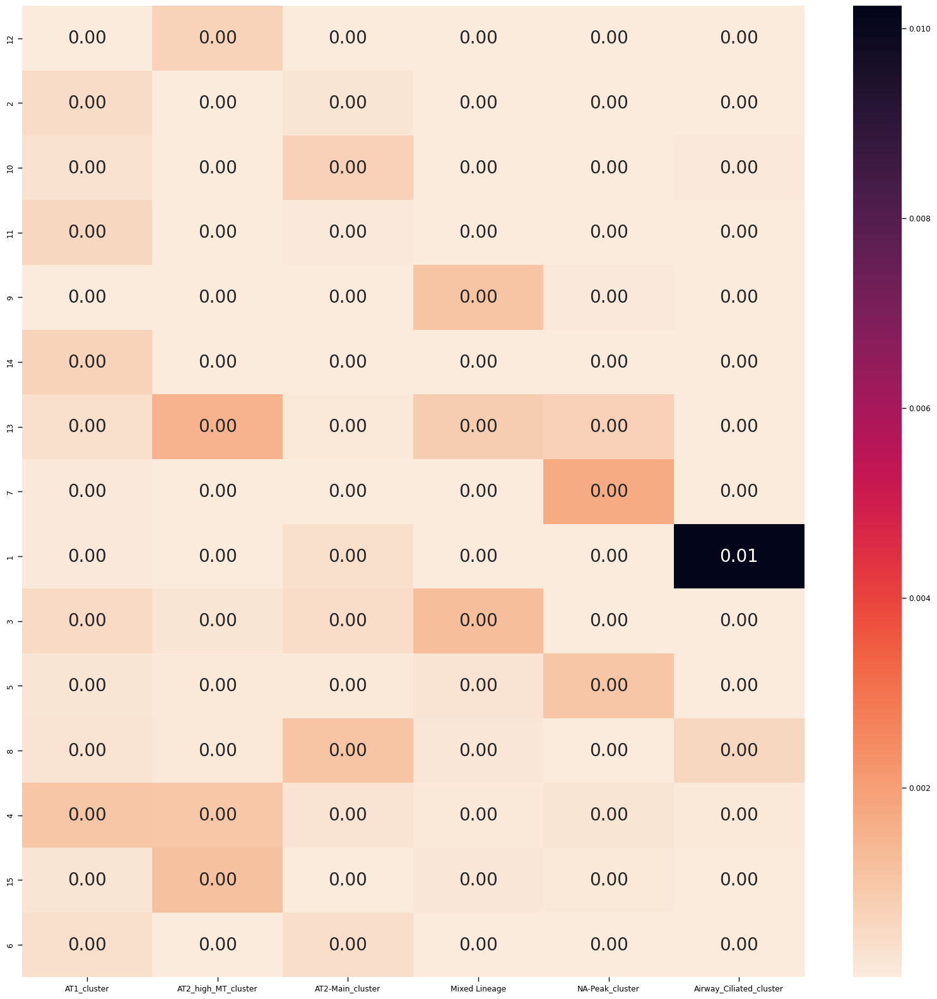

In [53]:
cmap = sns.cm.rocket_r
probability_df = probability_df.drop("AT2-Second_cluster", axis = 1)
row_sums = probability_df.sum(axis=1)
#probability_df.to_csv("LabeledClusterProbabilities.csv")
probability_df = probability_df.drop("size", axis = 1)

# Divide each cell by the row sum
probability_df = probability_df.div(row_sums, axis=0)
sns.heatmap(probability_df, annot=True, fmt=".2f", cmap = cmap)

#plt.savefig("seaborn_plot.pdf", format='pdf')


In [54]:
import math

# Function to calculate coordinates of a pentagon
def pentagon_coordinates(radius, rotation, center):
    points = []
    for k in range(5):
        x = center[0] + radius * math.cos(2 * math.pi * k / 5 + rotation)
        y = center[1] + radius * math.sin(2 * math.pi * k / 5 + rotation)
        points.append((x, y))
    return points

# Parameters
radius = 0.5
rotation = math.pi / 2  # Rotate to have one vertex pointing up
center = (0.5, 0.5)  # Center of the grid

# Calculate the coordinates
coordinates = pentagon_coordinates(radius, rotation, center)
coordinates


[(0.5, 1.0),
 (0.024471741852423234, 0.6545084971874737),
 (0.20610737385376338, 0.09549150281252633),
 (0.7938926261462365, 0.09549150281252622),
 (0.9755282581475768, 0.6545084971874736)]

In [55]:
#probability_df.to_csv("LabeledClusterProbabilities.csv")


In [56]:
weights

array([ 0.85926308,  0.97954238,  0.99774639,  1.01798382,  3.79039371,
       16.8721324 ,  5.19897727,  4.31598641,  4.69127862,  5.81284209])

In [57]:
#P_value Computation

bootstrap_size = 500
num_bootstraps = 100
comparisions = {'Primary_vs_BM', 'STK11mut_vs_NonSTK11mut', 'Primary_BM_STK_NonSTK'}
bootstrap_dfs = {}
tumor_only = tumor_cells_only


for y in comparisions:
    bootstrap_dfs[y] = []
for i in range(num_bootstraps):
    df = tumor_only.sample(n=bootstrap_size, random_state=i)
    for y in comparisions:
        samp = df.groupby([y,'Nearest_clustering_PCA']).size().unstack(fill_value=0)
        samp = samp.div(samp.sum(axis=1), axis=0)
        bootstrap_dfs[y].append(samp)

In [58]:
    with pd.ExcelWriter('TumorCellAssignCountMatrix.xlsx') as writer: 
        
        arr = [tumor_only.groupby(['Primary_BM_STK_NonSTK','Nearest_clustering_PCA']).size().unstack(fill_value=0),
                tumor_only.groupby(['Primary_vs_BM','Nearest_clustering_PCA']).size().unstack(fill_value=0),
                tumor_only.groupby(['STK11mut_vs_NonSTK11mut','Nearest_clustering_PCA']).size().unstack(fill_value=0),
                tumor_only.groupby(['STK11mut_vs_NonSTK11mut','Nearest_clustering_PCA']).size().unstack(fill_value=0)

            ]
        merged_dfs = pd.concat(arr)
        merged_dfs.to_excel(writer, sheet_name='markers_count')
        res = merged_dfs.div(merged_dfs.sum(axis=1), axis=0)
        res.to_excel(writer, sheet_name='markers_percent')
        for comp in {'Primary_vs_BM', 'STK11mut_vs_NonSTK11mut'}:
            
            comparision = comp

            all_columns = set()
            for y in bootstrap_dfs[comparision]:
                all_columns = all_columns | set(y.columns)

            columns = all_columns
            type_dict = {}
            for y in columns:
                type_dict[y] = []
                for obj in range(len(bootstrap_dfs[comparision][0])):
                    type_dict[y].append([])
            p_values = {}   
            for iteration in bootstrap_dfs[comparision]:

                for y in columns:
                    if y not in iteration.columns:
                        for z in range(len(bootstrap_dfs[comparision][0])):
                            type_dict[y][z].append(0)
                    else:
                        for z in range(len(bootstrap_dfs[comparision][0])):
                            type_dict[y][z].append(list(iteration[y])[z])
                    vals1 = stats.ttest_ind(a=type_dict[y][0], b=type_dict[y][1], equal_var=True, alternative='less').pvalue
                    vals2 = stats.ttest_ind(a=type_dict[y][0], b=type_dict[y][1], equal_var=True, alternative='greater').pvalue

                    p_values[y] =[ vals1 * len(columns) , vals2 * len(columns)]
            pvaldf = pd.DataFrame(p_values)[merged_dfs.columns]
            pvaldf.index = bootstrap_dfs[comparision][0].index
            pvaldf.to_excel(writer, sheet_name=comp+'_pvalue')
            
        for temp_Val in range(1):
            
            comparision = 'Primary_BM_STK_NonSTK'
            dataframe = x

            all_columns = set()
            for y in bootstrap_dfs[comparision]:
                all_columns = all_columns | set(y.columns)

            columns = all_columns
            type_dict = {}
            for y in columns:
                type_dict[y] = []
                for obj in range(len(bootstrap_dfs[comparision][0])):
                    type_dict[y].append([])
            p_values1 = {} 
            p_values2 = {}
            p_values3 = {}
            p_values4 = {}
            for iteration in bootstrap_dfs[comparision]:

                for y in columns:
                    if y not in iteration.columns:
                        for z in range(len(bootstrap_dfs[comparision][0])):
                            type_dict[y][z].append(0)
                    else:
                        for z in range(len(bootstrap_dfs[comparision][0])):
                            type_dict[y][z].append(list(iteration[y])[z])
                    
                    vals1 = stats.ttest_ind(a=type_dict[y][0], b=type_dict[y][1], equal_var=True, alternative='less').pvalue
                    vals2 = stats.ttest_ind(a=type_dict[y][0], b=type_dict[y][1], equal_var=True, alternative='greater').pvalue
                    p_values1[y] =[ vals1 * len(columns) , vals2 * len(columns)]
                    
                    vals1 = stats.ttest_ind(a=type_dict[y][0], b=type_dict[y][2], equal_var=True, alternative='less').pvalue
                    vals2 = stats.ttest_ind(a=type_dict[y][0], b=type_dict[y][2], equal_var=True, alternative='greater').pvalue
                    p_values2[y] =[ vals1 * len(columns) , vals2 * len(columns)]
                    
                    vals1 = stats.ttest_ind(a=type_dict[y][1], b=type_dict[y][3], equal_var=True, alternative='less').pvalue
                    vals2 = stats.ttest_ind(a=type_dict[y][1], b=type_dict[y][3], equal_var=True, alternative='greater').pvalue
                    p_values3[y] =[ vals1 * len(columns) , vals2 * len(columns)]

                    vals1 = stats.ttest_ind(a=type_dict[y][2], b=type_dict[y][3], equal_var=True, alternative='less').pvalue
                    vals2 = stats.ttest_ind(a=type_dict[y][2], b=type_dict[y][3], equal_var=True, alternative='greater').pvalue
                    p_values4[y] =[ vals1 * len(columns) , vals2 * len(columns)]


            pvaldf = pd.DataFrame(p_values1)[merged_dfs.columns]
            pvaldf.index = ['Non-STK11-mut (BRAIN_METS)', 'Non-STK11-mut (PRIMARY)'
                           ]
            pvaldf.to_excel(writer, sheet_name="nonSTK_PRI_v_BRAIN_pvalue")

            pvaldf = pd.DataFrame(p_values2)[merged_dfs.columns]
            pvaldf.index = ['Non-STK11-mut (BRAIN_METS)', 
                           'STK11-mut (BRAIN_METS)']
            pvaldf.to_excel(writer, sheet_name="BRAIN_nonSTK_v_STK_pvalue")

            pvaldf = pd.DataFrame(p_values3)[merged_dfs.columns]
            pvaldf.index = [ 'Non-STK11-mut (PRIMARY)',
                           'STK11-mut (PRIMARY)']
            pvaldf.to_excel(writer, sheet_name="PRI_nonSTK_v_STK_pvalue")
            
            pvaldf = pd.DataFrame(p_values4)[merged_dfs.columns]
            pvaldf.index = ['STK11-mut (BRAIN_METS)', 'STK11-mut (PRIMARY)']
            pvaldf.to_excel(writer, sheet_name="STK_PRI_v_BRAIN_pvalue")      

/home/ubuntu/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:7030: RuntimeWarning: invalid value encountered in scalar divide
  svar = ((n1 - 1) * v1 + (n2 - 1) * v2) / df
/home/ubuntu/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:7030: RuntimeWarning: invalid value encountered in scalar divide
  svar = ((n1 - 1) * v1 + (n2 - 1) * v2) / df
/home/ubuntu/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:7030: RuntimeWarning: invalid value encountered in scalar divide
  svar = ((n1 - 1) * v1 + (n2 - 1) * v2) / df


In [59]:
cluster_21_cells = pd.read_csv("Cluster_21.csv")
cluster_21_cells["Unnamed: 0"] = cluster_21_cells.apply(lambda x: "Tumor_" + x["Unnamed: 0"], axis = 1)
all_cells_umap["Cluster21"] = all_cells_umap['Unnamed: 0'].isin(cluster_21_cells["Unnamed: 0"])

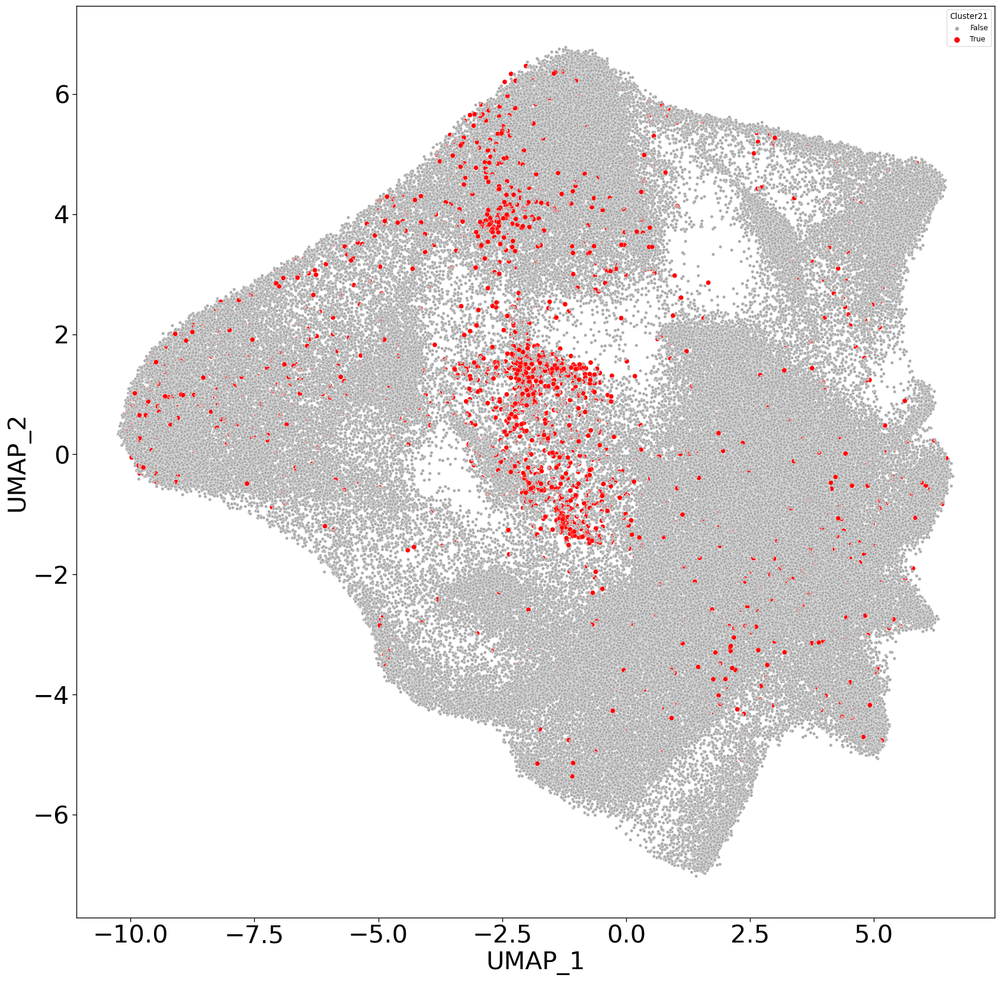

In [60]:
pallete = {
    True: "r",
    False: "#AAAAAA"
}

pallete_s = {
    True: 35,
    False: 15
}


import matplotlib
matplotlib.rc_file_defaults()
plt.rcParams['figure.figsize']=(20,20)


sns.set_context("paper", rc={"font.size":20,"axes.titlesize":30,"axes.labelsize":30})   


t = sns.scatterplot(data=all_cells_umap, x="UMAP_1", y="UMAP_2", hue="Cluster21",size = "Cluster21",
                sizes=pallete_s, palette=pallete)
sns.set_context("paper", rc={"font.size":20,"axes.titlesize":30,"axes.labelsize":30})   

t.tick_params(labelsize=30)

In [61]:
expression_levels = pd.read_csv("temp_expression.csv").T
new_header = expression_levels.iloc[0] #grab the first row for the header
expression_levels = expression_levels[1:] #take the data less the header row
expression_levels.columns = new_header
expression_levels

Unnamed: 0,SOX2,SOX9
Tumor_PA001_GCGAGAAGTACTTAGC.1,0,0
Tumor_PA001_TCGGTAAAGGCAAAGA.1,0,0
Tumor_PA001_CTCTAATCATGAGCGA.1,0,0
Tumor_PA001_CTTTGCGAGACTGTAA.1,0,0
Tumor_PA001_GTTACAGTCCAGAGGA.1,0,0
...,...,...
Control_CATACAGGTCGAGCTC.1_6,0,0
Control_TTCTAACCACGATAGG.1_6,0,0
Control_GTCATCCCAGCTACTA.1_6,0,0
Control_AGGTTGTCAGCTTTGA.1_6,0,0


In [62]:
expression_levels.index = expression_levels.index.str.replace('.', '-', regex=False)

expression_levels = expression_levels.loc[list(all_cells_umap["Unnamed: 0"])]
expression_levels.index =  all_cells_umap.index

all_cells_umap["SOX2"] = expression_levels["SOX2"]
all_cells_umap["SOX9"] = expression_levels["SOX9"]

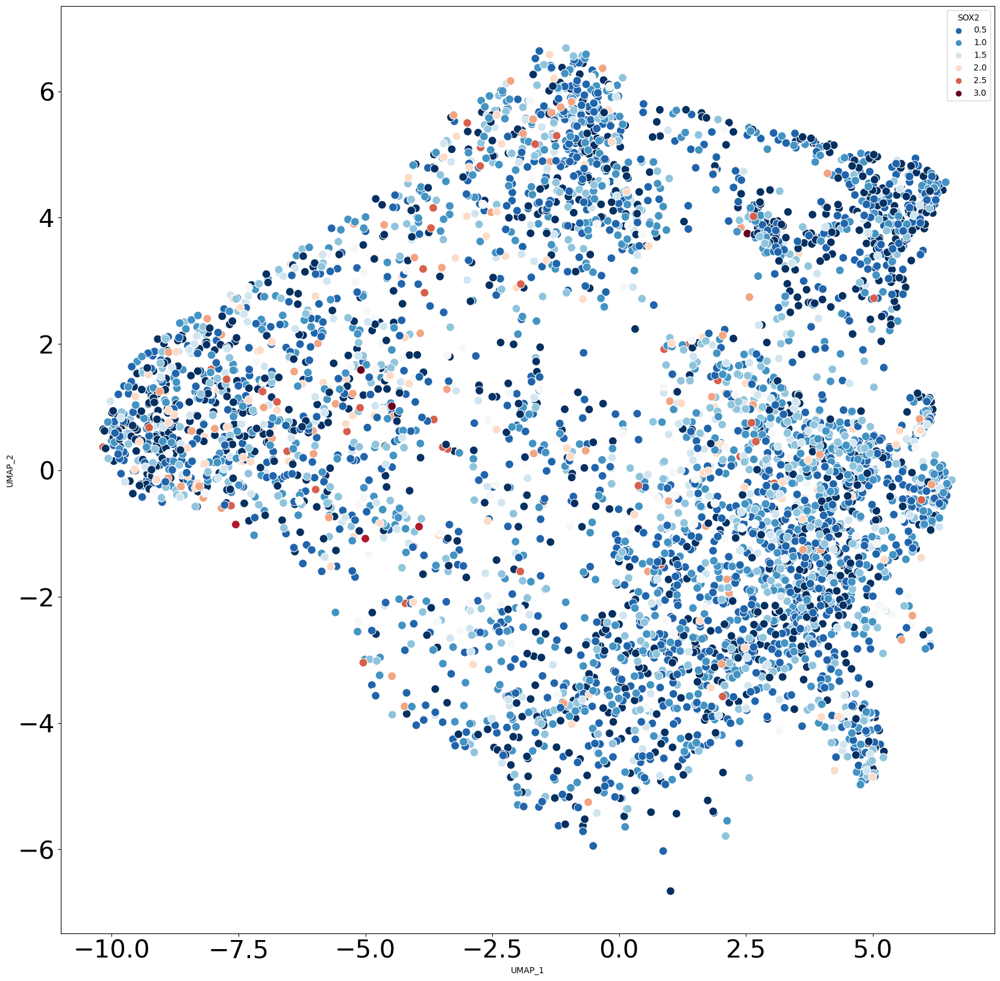

In [63]:
import matplotlib
matplotlib.rc_file_defaults()
plt.rcParams['figure.figsize']=(20,20)


from matplotlib.colors import LinearSegmentedColormap

# Create the RdBu reversed colormap
n_colors = 11
colors = plt.cm.RdBu(np.linspace(0, 1, n_colors))[::-1]  # Reversing the RdBu palette
cmap = LinearSegmentedColormap.from_list("RdBu_reversed", colors, N=n_colors)

t = sns.scatterplot(data=all_cells_umap[all_cells_umap["SOX2"]!= 0], x="UMAP_1", y="UMAP_2", hue="SOX2", s =100, palette=cmap)

t.tick_params(labelsize=30)


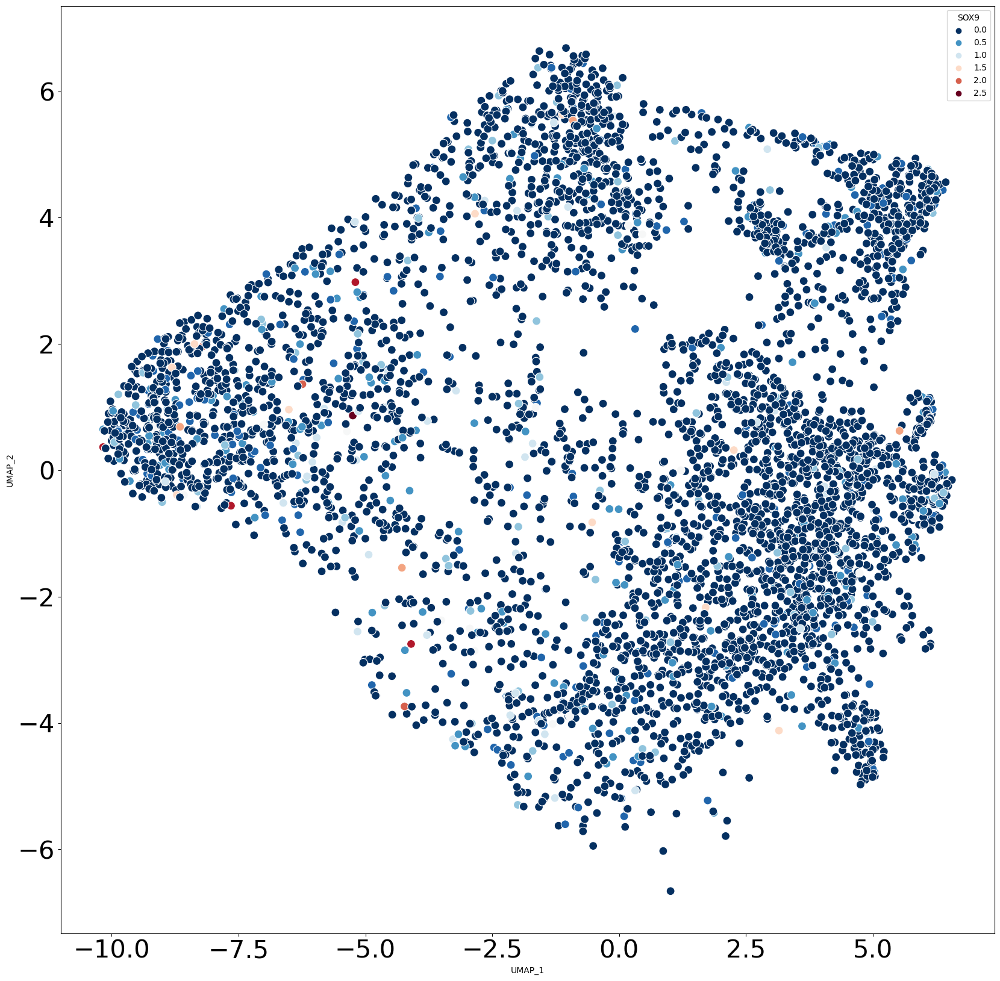

In [64]:

t = sns.scatterplot(data=all_cells_umap[all_cells_umap["SOX2"]!= 0], x="UMAP_1", y="UMAP_2", hue="SOX9", s =100, palette=cmap)

t.tick_params(labelsize=30)


In [65]:
expression_levels.index

RangeIndex(start=0, stop=151395, step=1)

In [66]:
all_cells_umap["Unnamed: 0"] = all_cells_umap["Unnamed: 0"].str.replace('-', '.', regex=False)



(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'AT1_cluster'),
  Text(1, 0, 'Mixed Lineage'),
  Text(2, 0, 'AT2-Main_cluster'),
  Text(3, 0, 'AT2_high_MT_cluster'),
  Text(4, 0, 'NA-Peak_cluster'),
  Text(5, 0, 'Airway_Ciliated_cluster')])

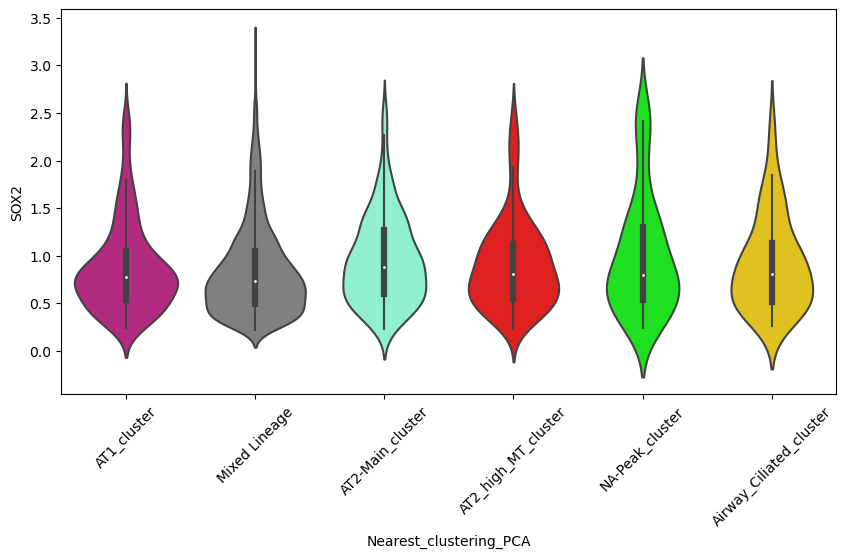

In [67]:
plt.rcParams['figure.figsize']=(10,5)

all_cells_umap["SOX2"] = pd.to_numeric(all_cells_umap["SOX2"])
all_cells_umap["SOX9"] = pd.to_numeric(all_cells_umap["SOX9"])

filters = all_cells_umap[all_cells_umap["Nearest_clustering_PCA"] != "AT2-Second_cluster"]
filters[["Unnamed..0","Nearest_clustering_PCA","SOX2","SOX9" ]].to_csv("UMAP_Integrated_withassignments_to.csv")

palette = {
 "AT2_high_MT_cluster" : "#ff0000",
 "Airway_Ciliated_cluster": "#ffd700",
 "AT1_cluster": "#c71585",
 "AT2-Main_cluster": "#7fffd4", 
 "NA-Peak_cluster": "#00ff00",
 "AT2-Second_cluster": "#808000",
 "NA": "#808080",
 "Mixed Lineage": "#808080"

}
sns.violinplot(data=filters[filters["SOX2"]!= 0], x="Nearest_clustering_PCA", y="SOX2", palette= palette)
plt.xticks(rotation=45)



(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'AT2_high_MT_cluster'),
  Text(1, 0, 'Mixed Lineage'),
  Text(2, 0, 'AT2-Main_cluster'),
  Text(3, 0, 'NA-Peak_cluster'),
  Text(4, 0, 'AT1_cluster'),
  Text(5, 0, 'Airway_Ciliated_cluster')])

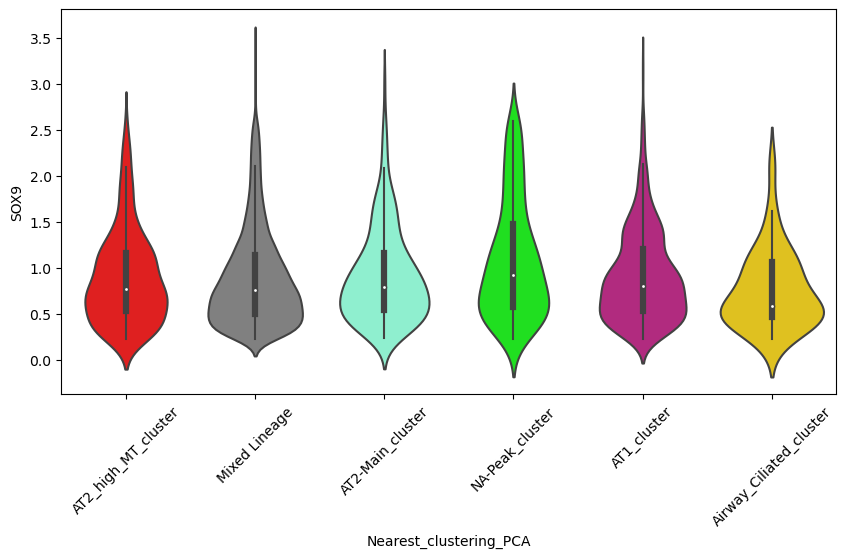

In [68]:
plt.rcParams['figure.figsize']=(10,5)

all_cells_umap["SOX2"] = pd.to_numeric(all_cells_umap["SOX2"])
all_cells_umap["SOX9"] = pd.to_numeric(all_cells_umap["SOX9"])

sns.violinplot(data=filters[filters["SOX9"]!= 0], x="Nearest_clustering_PCA", y="SOX9", palette= palette)
plt.xticks(rotation=45)


In [69]:
probability_df

,AT1_cluster,AT2_high_MT_cluster,AT2-Main_cluster,Mixed Lineage,NA-Peak_cluster,Airway_Ciliated_cluster
12,0.000008,6.725882e-04,0.000002,7.398079e-06,0.000004,6.418425e-07
2,0.000428,1.265059e-05,0.000196,9.837631e-06,0.000014,2.708048e-05
10,0.000270,1.612282e-06,0.000682,4.732828e-06,0.000004,4.672497e-05
11,0.000526,9.372261e-06,0.000059,1.357840e-05,0.000031,7.308033e-06
9,0.000008,1.980783e-05,0.000008,1.066503e-03,0.000078,4.196573e-07
14,0.000656,6.662254e-08,0.000003,2.620487e-07,0.000002,2.087506e-07
13,0.000318,1.486105e-03,0.000119,8.160420e-04,0.000682,2.667275e-05
7,0.000055,2.130130e-05,0.000032,3.886430e-05,0.001709,1.587017e-06
1,0.000079,6.863442e-06,0.000288,2.516595e-05,0.000002,1.023339e-02
3,0.000465,1.871725e-04,0.000375,1.231579e-03,0.000017,3.872350e-05


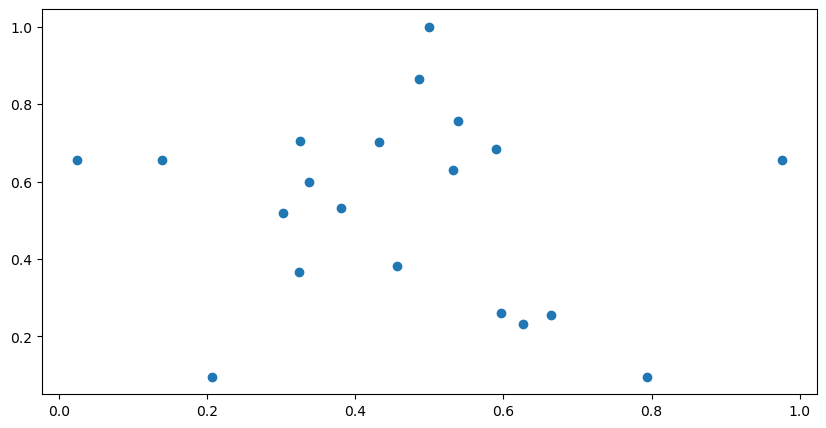

In [70]:
import math
import matplotlib.pyplot as plt

# Function to calculate coordinates of a pentagon
def pentagon_coordinates(radius, rotation, center):
    points = []
    for k in range(5):
        x = center[0] + radius * math.cos(2 * math.pi * k / 5 + rotation)
        y = center[1] + radius * math.sin(2 * math.pi * k / 5 + rotation)
        points.append((x, y))
    return points

# Parameters
radius = 0.5
rotation = math.pi / 2  # Rotate to have one vertex pointing up
center = (0.5, 0.5)  # Center of the grid

# Calculate the coordinates
coordinates = pentagon_coordinates(radius, rotation, center)

pentagon_points = pentagon_coordinates(radius, rotation, center)
#default_color = "#808080"
default_color = "#e8e8e8"
# Load the data
probability_df = pd.read_csv("LabeledClusterProbabilities.csv").set_index('Unnamed: 0')
sizes = list(probability_df['size'])

# Initialize a list for weighted coordinates
weighted_df_scores = []
t_pentagon_points = pentagon_points.copy()
t_pentagon_points.append((0.5, 0.5))


probability_df= pd.read_csv("LabeledClusterProbabilities.csv").set_index('Unnamed: 0')
sizes = list(probability_df['size'])
weighted_df_scores = []
for i,x in probability_df.iterrows():
    probabilities = [x['AT1_cluster'], x['AT2_high_MT_cluster'], x['AT2-Main_cluster'],
       x['NA-Peak_cluster'], x['Airway_Ciliated_cluster']]
    weighted_x = sum(p * vertex[0] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)
    weighted_y = sum(p * vertex[1] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)
    coordinates.append((weighted_x, weighted_y))



coordinates
plt.scatter([t[0] for t in coordinates], [t[1] for t in coordinates])


In [71]:
random_walk = pd.read_csv("random_walk_prob_results.csv").set_index("rownames").drop("Unnamed: 0", axis = 1)
random_walk = random_walk.drop("AT2-Second_cluster", axis = 1)
random_walk = random_walk.div(random_walk.sum(axis=1), axis=0)
random_walk['assignment'] = random_walk.apply(lambda row: row.idxmax(), axis=1)
dict(random_walk['assignment'] )
x_scores = []
y_scores = []
for i, row in random_walk.iterrows():
    probabilities = [row['AT1_cluster'], row['AT2_high_MT_cluster'], 
                     row['NA-Peak_cluster'], row['AT2-Main_cluster'], row['Airway_Ciliated_cluster'], row['Mixed Lineage']]
    
    weighted_x = sum(p * vertex[0] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)
    x_scores.append(weighted_x)
    weighted_y = sum(p * vertex[1] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)
    y_scores.append(weighted_y)

random_walk["X"] = x_scores
random_walk["Y"] = y_scores
#probability_df.to_csv("LabeledClusterProbabilities.csv")




Pentagon_0
Pentagon_1
Pentagon_2
Pentagon_3
Pentagon_4
12
2
10
11
9
14
13
7
1
3
5
8
4
15
6


/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.8 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.8 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWa

<Figure size 3000x1500 with 0 Axes>

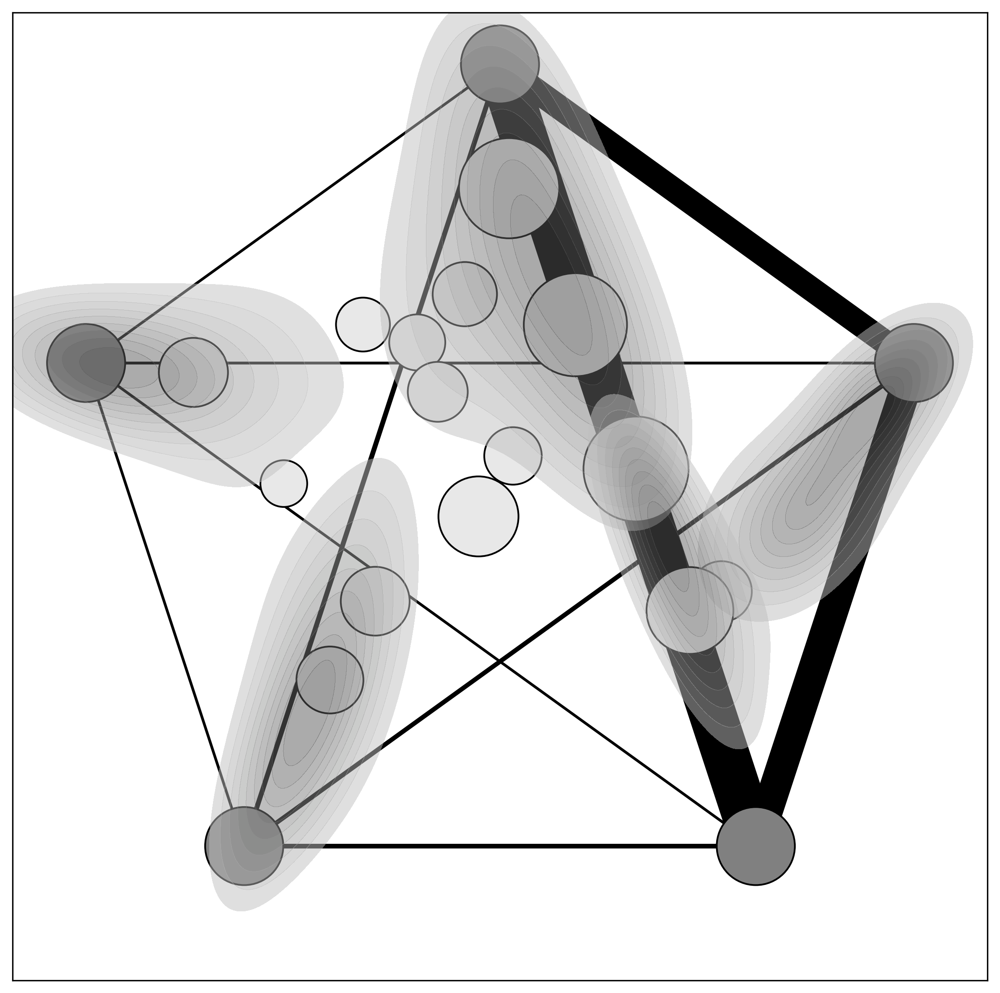

In [72]:
import pandas as pd
import math
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

f = plt.figure()


# Function to calculate coordinates of a pentagon
def pentagon_coordinates(radius, rotation, center):
    points = []
    for k in range(5):
        x = center[0] + radius * math.cos(2 * math.pi * k / 5 + rotation)
        y = center[1] + radius * math.sin(2 * math.pi * k / 5 + rotation)
        points.append((x, y))
    return points

# Parameters
radius = 0.5
rotation = math.pi / 2  # Rotate to have one vertex pointing up
center = (0.5, 0.5)  # Center of the grid

# Calculate the pentagon coordinates
pentagon_points = pentagon_coordinates(radius, rotation, center)
#default_color = "#808080"
default_color = "#e8e8e8"
# Load the data
probability_df = pd.read_csv("LabeledClusterProbabilities.csv").set_index('Unnamed: 0')
sizes = list(probability_df['size'])

# Initialize a list for weighted coordinates
weighted_df_scores = []
t_pentagon_points = pentagon_points.copy()
t_pentagon_points.append((0.5, 0.5))
# Calculate weighted coordinates
for i, row in probability_df.iterrows():
    probabilities = [row['AT1_cluster'], row['AT2_high_MT_cluster'], 
                     row['NA-Peak_cluster'], row['AT2-Main_cluster'], row['Airway_Ciliated_cluster'], row['Mixed Lineage']]
    
    weighted_x = sum(p * vertex[0] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)
    weighted_y = sum(p * vertex[1] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)
    weighted_df_scores.append((weighted_x, weighted_y))

# NetworkX plotting
G = nx.Graph()

# Add pentagon points as nodes
for idx, point in enumerate(pentagon_points):
    G.add_node(f'Pentagon_{idx}', pos=point)

# Add weighted scores as nodes
for idx, (coord, size) in enumerate(zip(weighted_df_scores, sizes)):
    G.add_node(probability_df.index[idx], pos=coord, size=size)

# Optionally, if logical, add edges here
#colors = ['#c71585', "#ff0000","#7fffd4", "#00ff00",  "#ffd700"]
colors = ['#808080', "#808080","#808080", "#808080",  "#808080"]

node_labels = {
    list(G.nodes)[0]:'AT1',
    list(G.nodes)[1]:'AT2 High MT ',
    list(G.nodes)[2]:'NA Peak',
    list(G.nodes)[3]:'AT2 Main',
    list(G.nodes)[4]:'Airway Ciliated'
}
for x in list(G.nodes):
    print(x)
    if "Penta" not in str(x):
        colors.append(default_color)
        node_labels[x] = x
        
        
# Position dictionary
pos = nx.get_node_attributes(G, 'pos')

# Size list, default size for pentagon points, adjust size for other nodes
sizes = [2000 for _ in pentagon_points] + [size*2.5 for size in sizes]  # Adjust scaling as needed

# Draw the network
fig, ax = plt.subplots(figsize=(10, 10))
ax.axis("off")
col = nx.draw_networkx_nodes(G, pos, nodelist=list(G.nodes), 
                             node_size=sizes, 
                             node_color=colors,
                             edgecolors='k',linewidths = 1, ax = ax)
col.set_zorder(-1.5)


#col = nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=12, font_color='k', ax=ax)
#col.set_zorder(1.5)
plt.xlim(-0.06, 1.06)  # Adjust limits
plt.ylim(-0.06, 1.06)  # Adjust limits

node_label_dictionary=  {
'AT1_cluster': list(G.nodes)[0],
'AT2_high_MT_cluster':list(G.nodes)[1],
'NA-Peak_cluster': list(G.nodes)[2],
'AT2-Main_cluster': list(G.nodes)[3],
'Airway_Ciliated_cluster': list(G.nodes)[4]
}
    
distances = pd.read_csv("PrimaryNodeDistances.csv")
for i, x in distances.iterrows():
    if x['2'] < 12.5 and x['0'] != x['1']:
        G.add_edge(node_label_dictionary[x['0']], node_label_dictionary[x['1']], weight=1 / x['2'])

edges = G.edges(data=True)
weights = np.log([e[2]['weight']+1 for e in edges])*20# Scale by 2 for visibility, adjust as needed
        
col=  nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights, ax = ax)

col.set_zorder(-2.5)


sns.kdeplot(data= random_walk[random_walk["assignment"] == "AT2_high_MT_cluster"]
                  , x="X", y="Y", ax = ax,thresh=.2, linewidths=4, fill = True, color="#808080", alpha=0.5, bw=0.8)

sns.kdeplot(data= random_walk[random_walk["assignment"] == "Airway_Ciliated_cluster"]
                  , x="X", y="Y", ax = ax, thresh=.2,linewidths=4, fill = True, color="#808080", alpha=0.5, bw=0.8)


sns.kdeplot(data= random_walk[random_walk["assignment"] == "AT1_cluster"]
                  , x="X", y="Y", ax = ax,thresh=.2, linewidths=4, fill = True, color="#808080", alpha=0.5, bw=0.8)

sns.kdeplot(data= random_walk[random_walk["assignment"] == "AT2-Main_cluster"]
                  , x="X", y="Y", ax = ax, thresh=.2,linewidths=4, fill = True, color="#808080", alpha=0.5, bw=0.8)

sns.kdeplot(data= random_walk[random_walk["assignment"] == "NA-Peak_cluster"]
                  , x="X", y="Y", ax = ax,thresh=.2,linewidths=4, fill = True, color="#808080", alpha=0.5, bw=0.8)


ax.axis("on")
plt.show()
fig.savefig("pentagon_probabilities_nolabel.pdf")

In [73]:
weights

array([ 1.54505113, 14.03364659, 26.97146326,  2.79809407,  1.61739017,
        1.55055496,  1.5612414 ,  2.57656147,  2.67827167, 17.7469806 ])

In [74]:
probability_df= pd.read_csv("LabeledClusterProbabilities.csv").set_index('Unnamed: 0')


In [75]:
distances['2']

0      0.000000
1     11.872338
2     12.450992
3     12.405068
4     12.316823
5     11.872338
6      0.000000
7      0.983146
8      0.699945
9      7.273016
10    12.450992
11     0.983146
12     0.000000
13     0.350640
14     6.659377
15    12.405068
16     0.699945
17     0.350640
18     0.000000
19     6.978658
20    12.316823
21     7.273016
22     6.659377
23     6.978658
24     0.000000
Name: 2, dtype: float64

/tmp/ipykernel_1132/2472913157.py:54: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  row = c21_prob_df.mean()
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.8 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


Pentagon_0
Pentagon_1
Pentagon_2
Pentagon_3
Pentagon_4
12
2
10
11
9
14
13
7
1
3
5
8
4
15
6


/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.8 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.8 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/home/ubuntu/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarn

<Figure size 3000x1500 with 0 Axes>

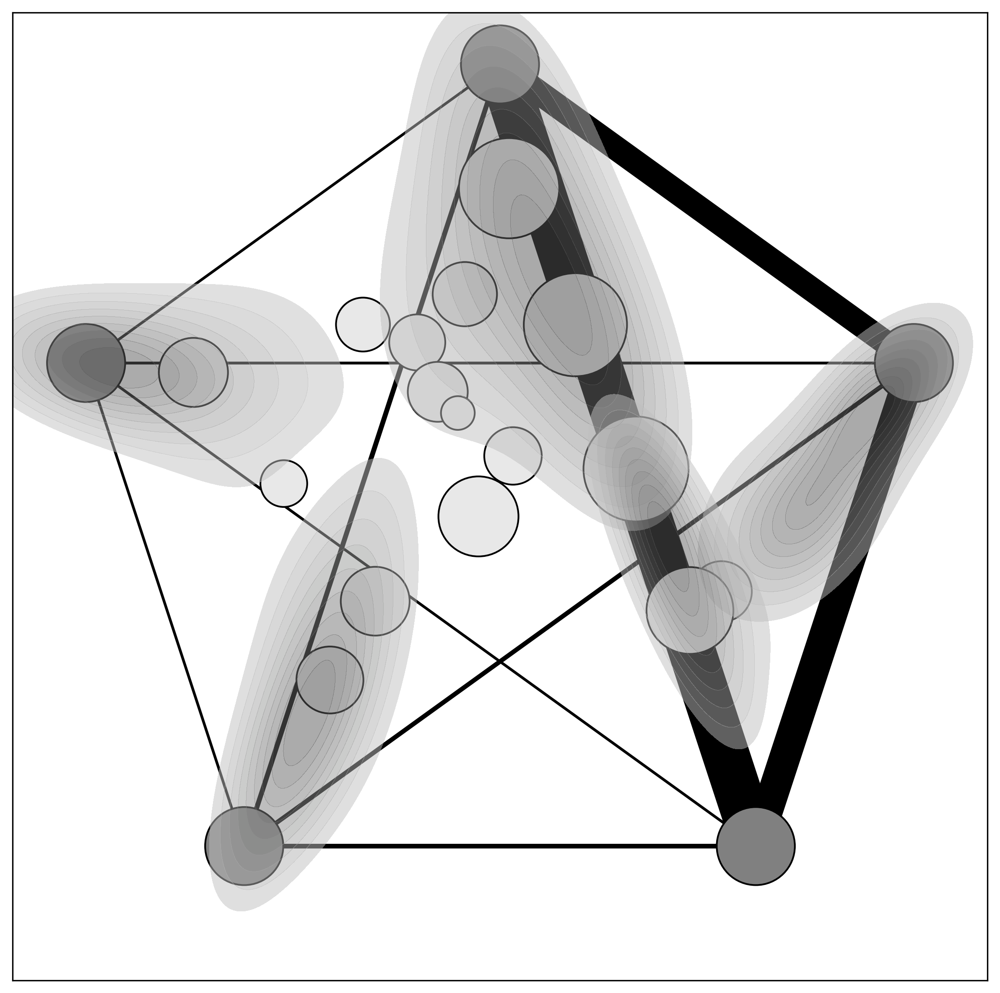

In [77]:
import pandas as pd
import math
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

f = plt.figure()


# Function to calculate coordinates of a pentagon
def pentagon_coordinates(radius, rotation, center):
    points = []
    for k in range(5):
        x = center[0] + radius * math.cos(2 * math.pi * k / 5 + rotation)
        y = center[1] + radius * math.sin(2 * math.pi * k / 5 + rotation)
        points.append((x, y))
    return points

# Parameters
radius = 0.5
rotation = math.pi / 2  # Rotate to have one vertex pointing up
center = (0.5, 0.5)  # Center of the grid

# Calculate the pentagon coordinates
pentagon_points = pentagon_coordinates(radius, rotation, center)
#default_color = "#808080"
default_color = "#e8e8e8"
# Load the data
probability_df = pd.read_csv("LabeledClusterProbabilities.csv").set_index('Unnamed: 0')
sizes = list(probability_df['size'])

# Initialize a list for weighted coordinates
weighted_df_scores = []
t_pentagon_points = pentagon_points.copy()
t_pentagon_points.append((0.5, 0.5))
# Calculate weighted coordinates
for i, row in probability_df.iterrows():
    probabilities = [row['AT1_cluster'], row['AT2_high_MT_cluster'], 
                     row['NA-Peak_cluster'], row['AT2-Main_cluster'], row['Airway_Ciliated_cluster'], row['Mixed Lineage']]
    
    weighted_x = sum(p * vertex[0] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)
    weighted_y = sum(p * vertex[1] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)
    weighted_df_scores.append((weighted_x, weighted_y))


c21_prob_df = pd.read_csv("random_walk_prob_results_cluster21.csv")

cluster_21_cells = pd.read_csv("Cluster_21.csv")
cluster_21_cells["Unnamed: 0"] = cluster_21_cells.apply(lambda x: "Tumor_" + x["Unnamed: 0"], axis = 1)
c21_prob_df = c21_prob_df[c21_prob_df['Unnamed: 0'].isin(cluster_21_cells["Unnamed: 0"])]
c21_prob_df = c21_prob_df.drop("AT2-Second_cluster", axis = 1)
row = c21_prob_df.mean()
probabilities = [row['AT1_cluster'], row['AT2_high_MT_cluster'], 
                     row['NA-Peak_cluster'], row['AT2-Main_cluster'], row['Airway_Ciliated_cluster'], row['Mixed Lineage']]
    
weighted_x = sum(p * vertex[0] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)
weighted_y = sum(p * vertex[1] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)

# NetworkX plotting
G = nx.Graph()

# Add pentagon points as nodes
for idx, point in enumerate(pentagon_points):
    G.add_node(f'Pentagon_{idx}', pos=point)

# Add weighted scores as nodes
for idx, (coord, size) in enumerate(zip(weighted_df_scores, sizes)):
    G.add_node(probability_df.index[idx], pos=coord, size=size)
    

# Optionally, if logical, add edges here
#colors = ['#c71585', "#ff0000","#7fffd4", "#00ff00",  "#ffd700"]
colors = ['#808080', "#808080","#808080", "#808080",  "#808080"]

node_labels = {
    list(G.nodes)[0]:'AT1',
    list(G.nodes)[1]:'AT2 High MT ',
    list(G.nodes)[2]:'NA Peak',
    list(G.nodes)[3]:'AT2 Main',
    list(G.nodes)[4]:'Airway Ciliated'
}
for x in list(G.nodes):
    print(x)
    if "Penta" not in str(x):
        colors.append(default_color)
        node_labels[x] = x
        
G.add_node("Cluster 21", pos=(weighted_x, weighted_y) , size=len(c21_prob_df)/10)
node_labels["Cluster 21"] = "Cluster 21"
colors.append(default_color)
sizes.append(len(c21_prob_df)/10)
# Position dictionary
pos = nx.get_node_attributes(G, 'pos')

# Size list, default size for pentagon points, adjust size for other nodes
sizes = [2000 for _ in pentagon_points] + [size*2.5 for size in sizes]  # Adjust scaling as needed

# Draw the network
fig, ax = plt.subplots(figsize=(10, 10))
ax.axis("off")
col = nx.draw_networkx_nodes(G, pos, nodelist=list(G.nodes), 
                             node_size=sizes, 
                             node_color=colors,
                             edgecolors='k',linewidths = 1, ax = ax)
col.set_zorder(-1.5)


#col = nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=12, font_color='k', ax=ax)
#col.set_zorder(1.5)
plt.xlim(-0.06, 1.06)  # Adjust limits
plt.ylim(-0.06, 1.06)  # Adjust limits

node_label_dictionary=  {
'AT1_cluster': list(G.nodes)[0],
'AT2_high_MT_cluster':list(G.nodes)[1],
'NA-Peak_cluster': list(G.nodes)[2],
'AT2-Main_cluster': list(G.nodes)[3],
'Airway_Ciliated_cluster': list(G.nodes)[4]
}
    
distances = pd.read_csv("PrimaryNodeDistances.csv")
for i, x in distances.iterrows():
    if x['2'] < 12.5 and x['0'] != x['1']:
        G.add_edge(node_label_dictionary[x['0']], node_label_dictionary[x['1']], weight=1 / x['2'])

edges = G.edges(data=True)
weights = np.log([e[2]['weight']+1 for e in edges])*20# Scale by 2 for visibility, adjust as needed
        
col=  nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights, ax = ax)
sns.kdeplot(data= random_walk[random_walk["assignment"] == "AT2_high_MT_cluster"]
                  , x="X", y="Y", ax = ax,thresh=.2, linewidths=4, fill = True, color="#808080", alpha=0.5, bw=0.8)

sns.kdeplot(data= random_walk[random_walk["assignment"] == "Airway_Ciliated_cluster"]
                  , x="X", y="Y", ax = ax, thresh=.2,linewidths=4, fill = True, color="#808080", alpha=0.5, bw=0.8)


sns.kdeplot(data= random_walk[random_walk["assignment"] == "AT1_cluster"]
                  , x="X", y="Y", ax = ax,thresh=.2, linewidths=4, fill = True, color="#808080", alpha=0.5, bw=0.8)

sns.kdeplot(data= random_walk[random_walk["assignment"] == "AT2-Main_cluster"]
                  , x="X", y="Y", ax = ax, thresh=.2,linewidths=4, fill = True, color="#808080", alpha=0.5, bw=0.8)

sns.kdeplot(data= random_walk[random_walk["assignment"] == "NA-Peak_cluster"]
                  , x="X", y="Y", ax = ax,thresh=.2,linewidths=4, fill = True, color="#808080", alpha=0.5, bw=0.8)


col.set_zorder(-2.5)
ax.axis("on")
plt.show()
fig.savefig("pentagon_probabilities_c21_no_labels.pdf")

In [71]:
c21_prob_df = pd.read_csv("random_walk_prob_results_cluster21.csv")

cluster_21_cells = pd.read_csv("Cluster_21.csv")
cluster_21_cells["Unnamed: 0"] = cluster_21_cells.apply(lambda x: "Tumor_" + x["Unnamed: 0"], axis = 1)
c21_prob_df = c21_prob_df[c21_prob_df['Unnamed: 0'].isin(cluster_21_cells["Unnamed: 0"])]
c21_prob_df = c21_prob_df.drop("AT2-Second_cluster", axis = 1)
row = c21_prob_df.mean()
probabilities = [row['AT1_cluster'], row['AT2_high_MT_cluster'], 
                     row['NA-Peak_cluster'], row['AT2-Main_cluster'], row['Airway_Ciliated_cluster'], row['Mixed Lineage']]
    
weighted_x = sum(p * vertex[0] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)
weighted_y = sum(p * vertex[1] for p, vertex in zip(probabilities, t_pentagon_points)) / sum(probabilities)

weighted_x, weighted_y


/tmp/ipykernel_6078/3944346058.py:7: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  row = c21_prob_df.mean()


(0.45157199634514406, 0.5966174372723523)